In [2]:
from google.colab import drive
import pandas as pd
import cv2
import os

drive.mount('/content/drive')
image_dir = '/content/drive/MyDrive/Sanya/DID-AEZ-12/IITD Database'

Mounted at /content/drive


#Loading the data

In [38]:
from google.colab import drive
import pandas as pd
import cv2
import os

drive.mount('/content/drive')
image_dir = '/content/drive/MyDrive/Sanya/DID-AEZ-12/IITD Database'

def read_images(image_dir):
    image_data = []
    for subject_folder in os.listdir(image_dir):
        #I have deleted the normalised images and readme
        subject_path = os.path.join(image_dir, subject_folder)
        if os.path.isdir(subject_path):
            for image_file in os.listdir(subject_path):
                if image_file.endswith(('.bmp')):
                    image_path = os.path.join(subject_path, image_file)
                    try:
                        img = cv2.imread(image_path)
                        if img is not None:
                                image_number, label = image_file.split('_')  # Splits into ["01", "L.jpg"]
                                label = label.split('.')[0]  # Removes file extension, so label = "L"
                                image_data.append([subject_folder, image_number, label, img])
                        else:
                            print(f"Could not read image: {image_path}")

                    except Exception as e:
                        print(f"Error processing image {image_path}: {e}")
    return image_data

image_data = read_images(image_dir)
df_images = pd.DataFrame(image_data, columns=['Subject', 'Sample', 'L/R', 'Image'])
print(df_images.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
  Subject Sample    L/R                                              Image
0     005     03  L (1)  [[[255, 255, 255], [185, 185, 185], [186, 186,...
1     005     07      L  [[[250, 250, 250], [197, 197, 197], [190, 190,...
2     005     06      L  [[[255, 255, 255], [190, 190, 190], [192, 192,...
3     005     01  L (1)  [[[255, 255, 255], [193, 193, 193], [189, 189,...
4     005     08      L  [[[248, 248, 248], [193, 193, 193], [185, 185,...


In [39]:
df_images['L/R'].unique()

array(['L (1)', 'L', 'R', 'R (1)'], dtype=object)

In [40]:
df_images[df_images['Subject']=="005"]

,Subject,Sample,L/R,Image
0,005,03,L (1),"[[[255, 255, 255], [185, 185, 185], [186, 186,..."
1,005,07,L,"[[[250, 250, 250], [197, 197, 197], [190, 190,..."
2,005,06,L,"[[[255, 255, 255], [190, 190, 190], [192, 192,..."
3,005,01,L (1),"[[[255, 255, 255], [193, 193, 193], [189, 189,..."
4,005,08,L,"[[[248, 248, 248], [193, 193, 193], [185, 185,..."
5,005,01,L,"[[[255, 255, 255], [193, 193, 193], [189, 189,..."
6,005,05,L,"[[[255, 255, 255], [190, 190, 190], [192, 192,..."
7,005,03,L,"[[[255, 255, 255], [185, 185, 185], [186, 186,..."
8,005,04,L,"[[[252, 252, 252], [191, 191, 191], [190, 190,..."
9,005,02,L (1),"[[[255, 255, 255], [185, 185, 185], [183, 183,..."


There are duplicates for same sample

#Part 1

##Iris Localization

• Detect and remove specular reflection spots using a reflection mask.

In [41]:
import numpy as np

def remove_specular_reflection(image, threshold=200):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mask = gray > threshold
    result = cv2.inpaint(image, mask.astype(np.uint8) * 255, 3, cv2.INPAINT_TELEA)
    return result

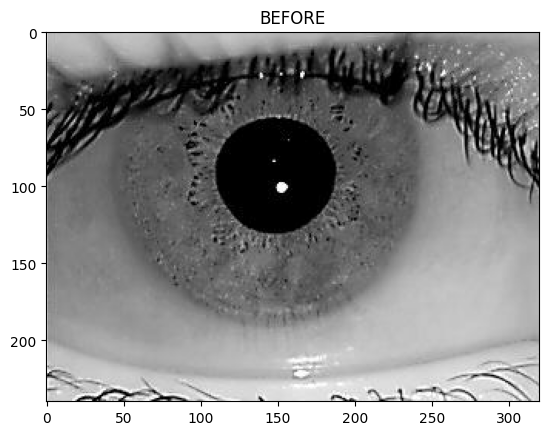

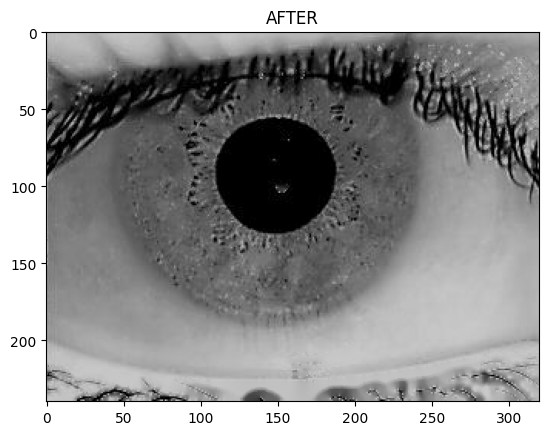

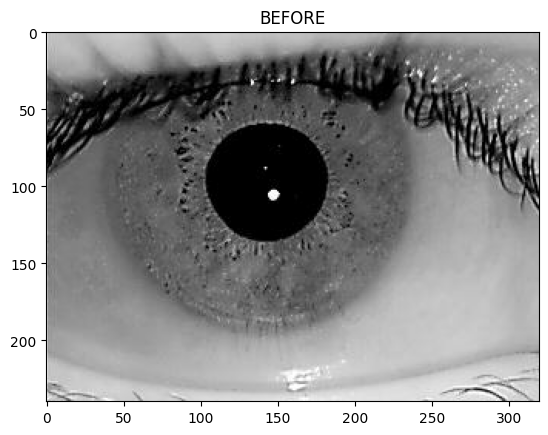

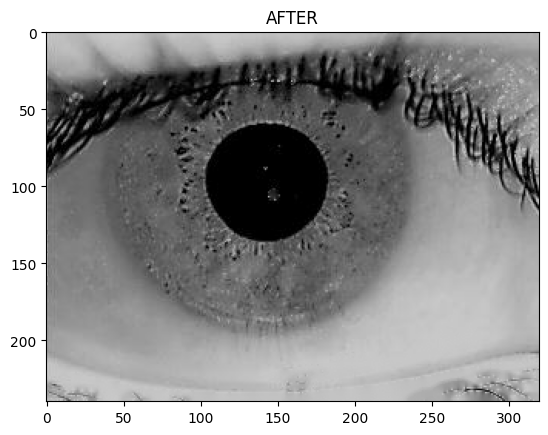

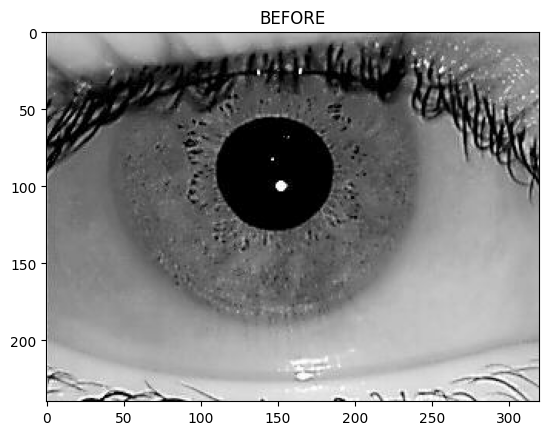

...

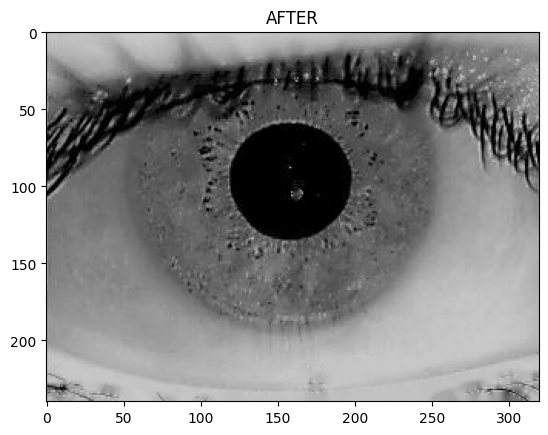

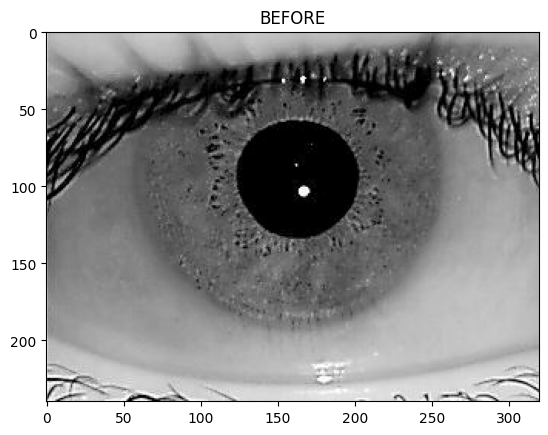

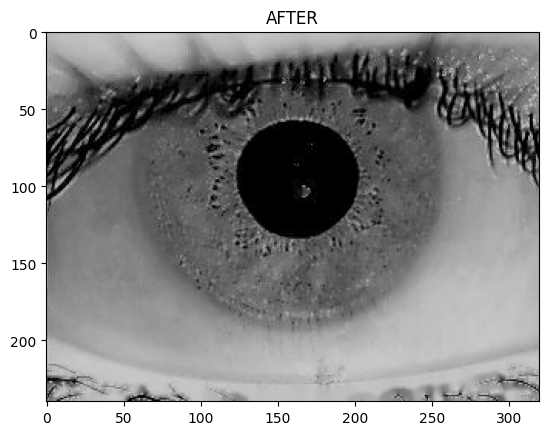

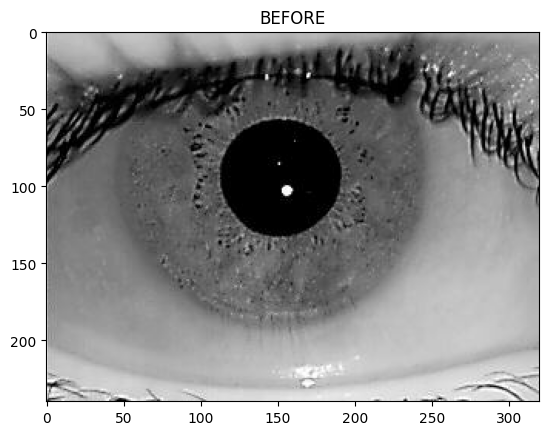

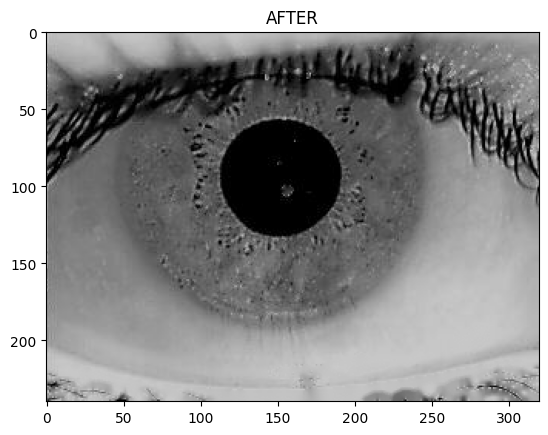

In [42]:
test_images = df_images[df_images['Subject'] == "005"]

import numpy as np
import matplotlib.pyplot as plt

for i in test_images['Image']:
    plt.imshow(i)
    plt.title("BEFORE")
    plt.show()
    output = remove_specular_reflection(i)
    plt.imshow(output)
    plt.title("AFTER")
    plt.show()

In [43]:
df_images['Image_no_reflection'] = df_images['Image'].apply(lambda img: remove_specular_reflection(img))

• Enhance the eye image using a 2D Gaussian filter and histogram equalization.

In [44]:
def enhance_image(image):
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    # Histogram equalization
    lab = cv2.cvtColor(blurred, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return enhanced_img

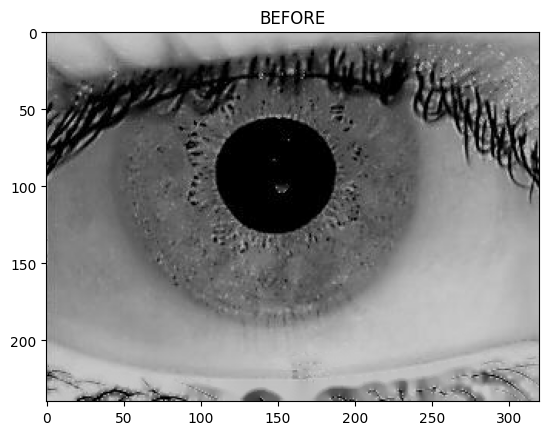

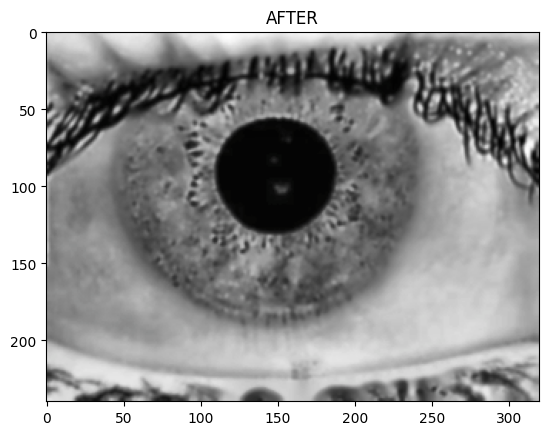

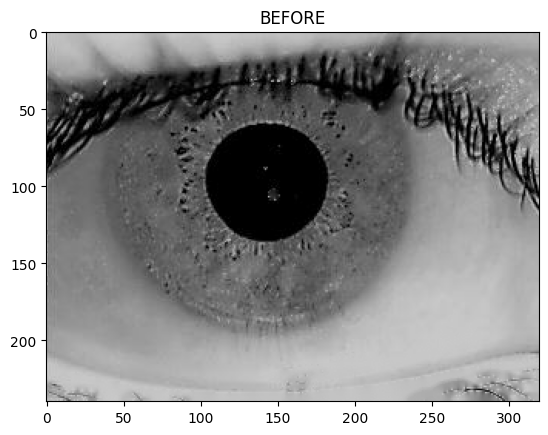

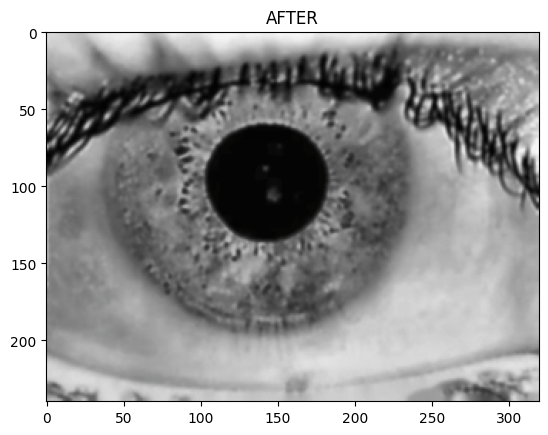

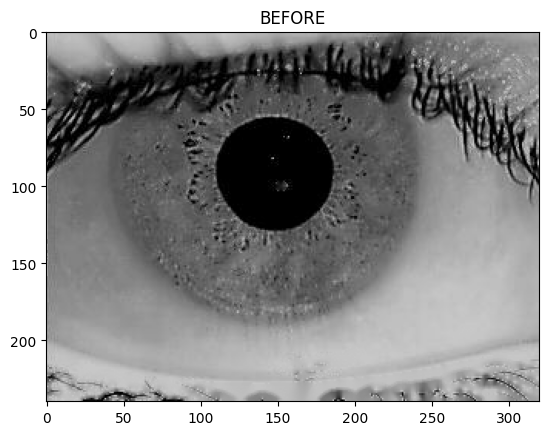

...

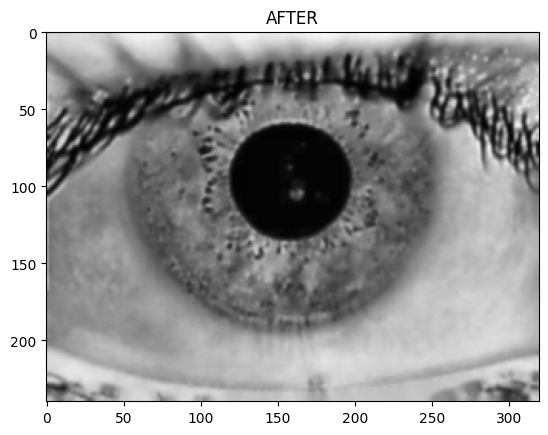

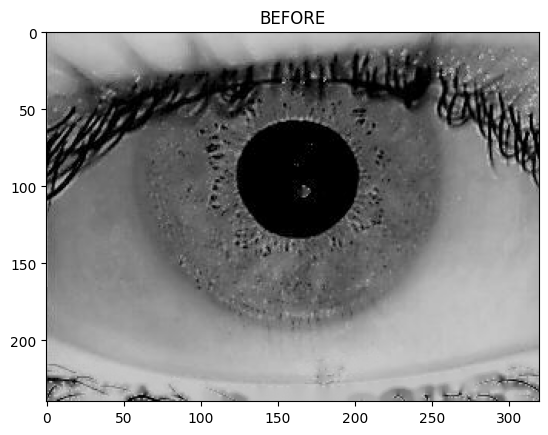

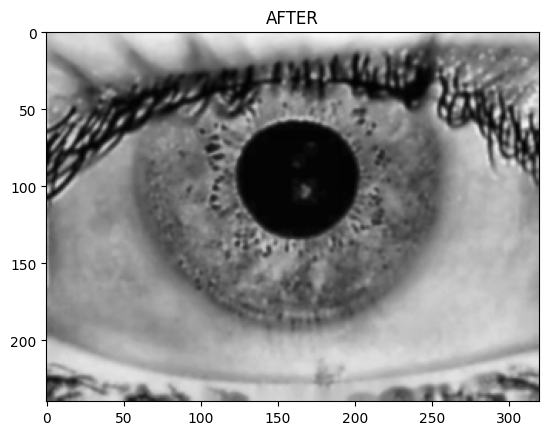

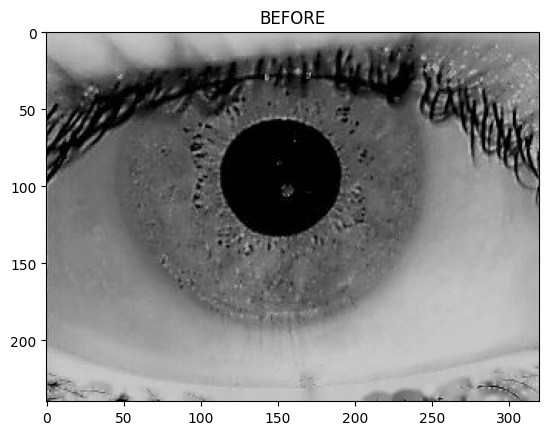

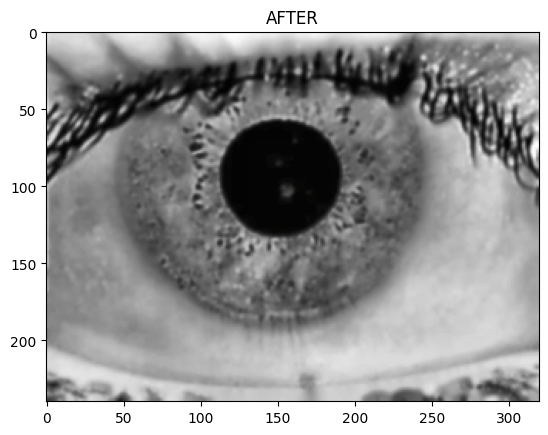

In [45]:
test_images = df_images[df_images['Subject'] == "005"]

for i in test_images['Image_no_reflection']:
    plt.imshow(i)
    plt.title("BEFORE")
    plt.show()
    output = enhance_image(i)
    plt.imshow(output)
    plt.title("AFTER")
    plt.show()

In [46]:
df_images['Enhanced_Image'] = df_images['Image_no_reflection'].apply(lambda img: enhance_image(img))

Apply Circular Hough Transform (CHT) to detect inner and outer iris boundaries.

In [47]:
df_images = df_images[df_images['Subject'] != "005"]

In [48]:
image = df_images[df_images['Subject'] == "006"].iloc[0]

In [49]:
image

,33
Subject,006
Sample,07
L/R,L
Image,"[[[56, 56, 56], [22, 22, 22], [2, 2, 2], [0, 0..."
Image_no_reflection,"[[[56, 56, 56], [22, 22, 22], [2, 2, 2], [0, 0..."
Enhanced_Image,"[[[74, 74, 74], [61, 61, 61], [42, 43, 42], [3..."


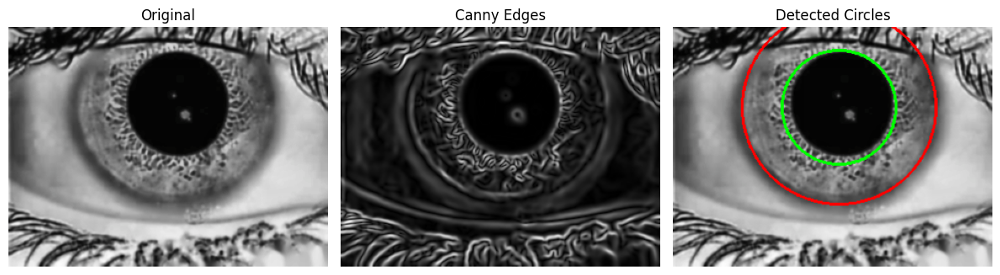

Pupil detected: center=(166,80), radius=57


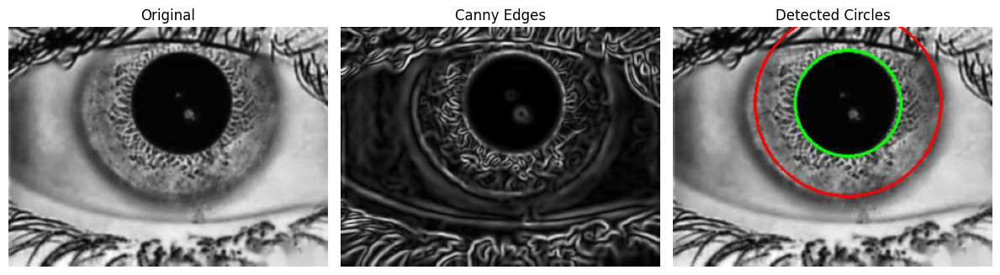

Pupil detected: center=(175,76), radius=53


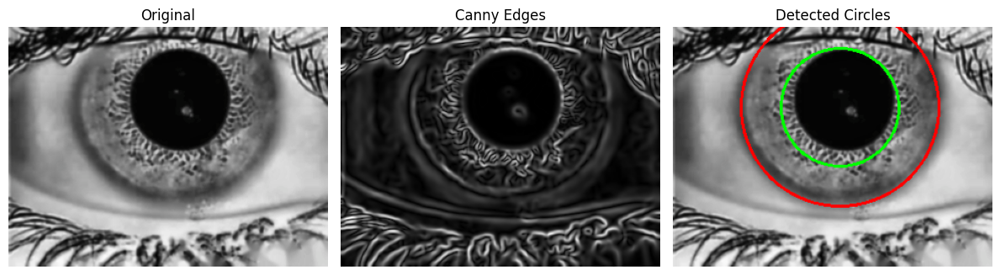

Pupil detected: center=(167,80), radius=59


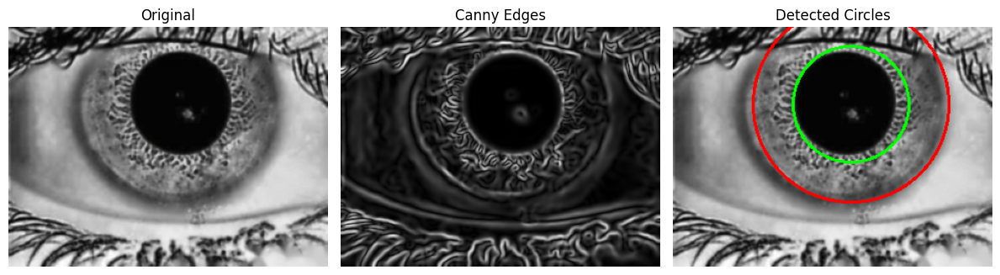

Pupil detected: center=(178,77), radius=58


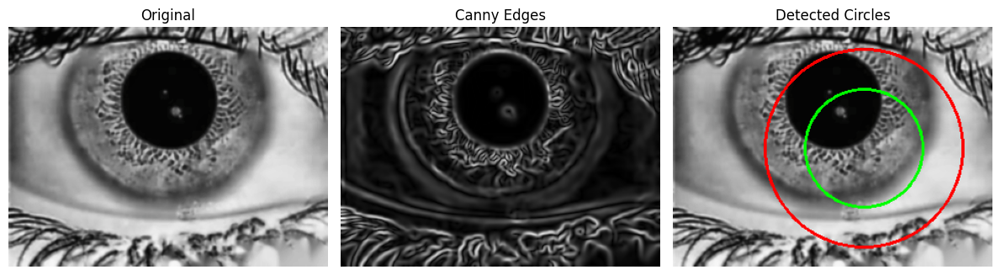

Pupil detected: center=(191,121), radius=59


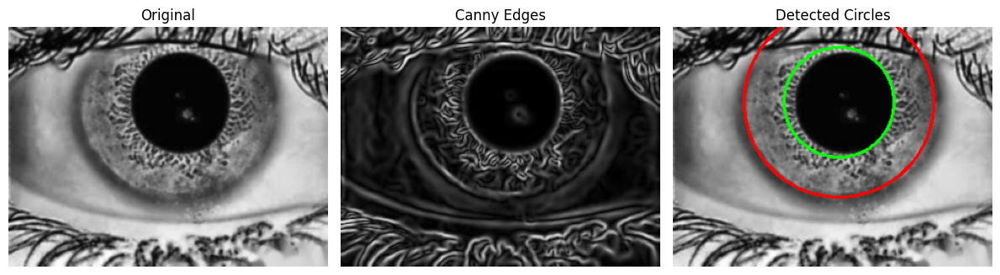

Pupil detected: center=(166,75), radius=55


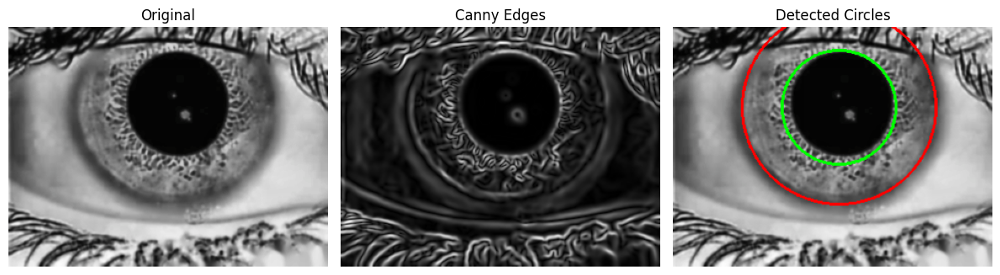

Pupil detected: center=(166,80), radius=57


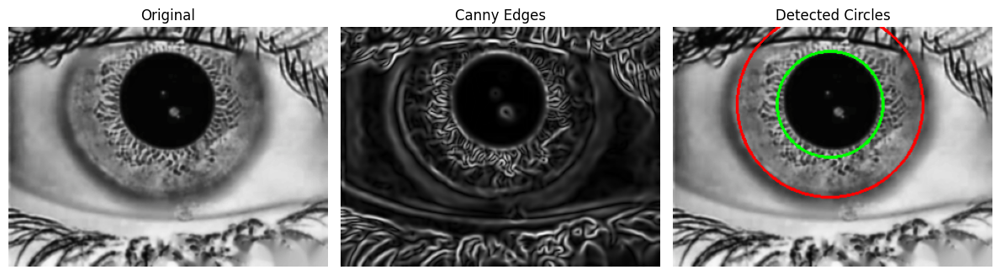

Pupil detected: center=(157,77), radius=53


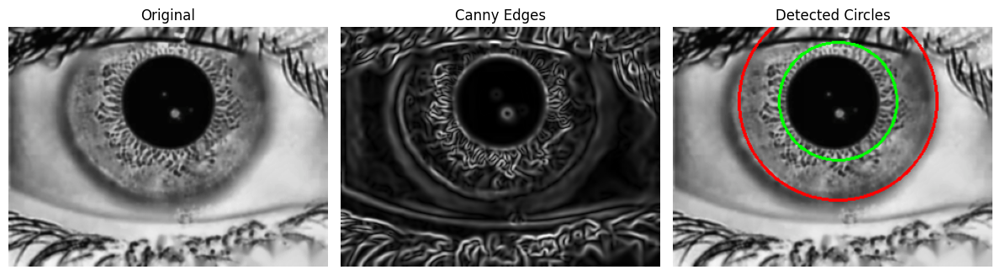

Pupil detected: center=(165,74), radius=59


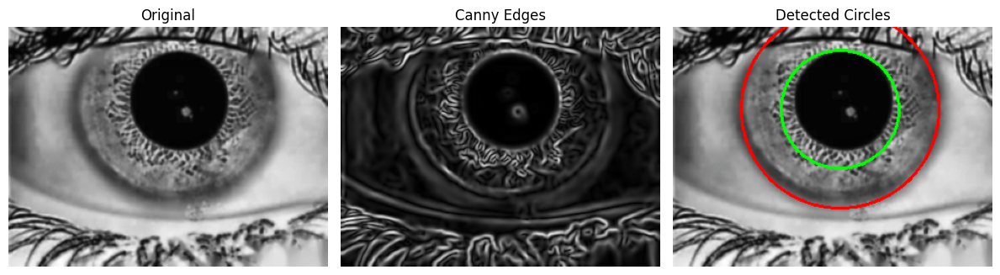

Pupil detected: center=(167,82), radius=59


In [53]:
def detect_iris_boundaries(image):
    result_img = image.copy()
    if len(image.shape) > 2:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    blurred = cv2.bilateralFilter(enhanced, 9, 75, 75)
    sobel_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=7, scale =3)
    sobel_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=7, scale =3)
    edges = cv2.magnitude(sobel_x, sobel_y)
    h, w = gray.shape
    center_x, center_y = w // 2, h // 2
    circles = cv2.HoughCircles(
        blurred,
        cv2.HOUGH_GRADIENT,
        dp=1.2,
        minDist=h//4,
        param1=50,  # Canny high threshold
        param2=30,  # Accumulator threshold
        minRadius=min(h,w)//10,
        maxRadius=min(h,w)//4
    )
    pupil = None
    iris = None
    radius = 40
    if circles is not None:
        circles = np.uint16(np.around(circles))[0]
        circles = sorted(circles, key=lambda x: x[2])
        valid_circles = [c for c in circles if np.sqrt((c[0] - center_x)**2 + (c[1] - center_y)**2) < min(h,w)//4]
        if len(valid_circles) >= 2:
            pupil = valid_circles[-1]
            cv2.circle(result_img, (pupil[0], pupil[1]), pupil[2], (0, 255, 0), 2)
            cv2.circle(result_img, (pupil[0], pupil[1]), pupil[2]+radius, (255, 0, 0), 2)
        elif len(valid_circles) == 1:
            if valid_circles[0][2] < min(h,w)//5:
                pupil = valid_circles[0]
                cv2.circle(result_img, (pupil[0], pupil[1]), pupil[2], (0, 0, 255), 2)
                cv2.circle(result_img, (pupil[0], pupil[1]), pupil[2]+radius, (255, 255, 0), 2)
    return result_img, edges, pupil, iris

# Updated visualization code
def visualize_iris_detection(image):
    output, edges, pupil, iris = detect_iris_boundaries(image.copy())

    plt.figure(figsize=(12, 4))

    plt.subplot(131)
    plt.imshow(image, cmap='gray')
    plt.title("Original")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(edges, cmap='gray')
    plt.title("Canny Edges")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(output, cmap='gray')
    plt.title("Detected Circles")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    if pupil is None and iris is None:
        print("No circles detected")
    else:
        if pupil is not None:
            print(f"Pupil detected: center=({pupil[0]},{pupil[1]}), radius={pupil[2]}")
        if iris is not None:
            print(f"Iris detected: center=({iris[0]},{iris[1]}), radius={iris[2]}")

test_images = df_images[df_images['Subject'] == "006"]

# For your loop through test images:
for i in test_images['Enhanced_Image']:
    visualize_iris_detection(i)

In [54]:
df_images['CHT_Image'], df_images['Edges'], df_images['Pupil'], df_images['Iris'] = zip(*df_images['Enhanced_Image'].apply(lambda img: detect_iris_boundaries(img.copy())))

Detect eyelid boundaries using an anisotropic diffusion filter and Radon transform.


In [55]:
def detect_eyelids(image, iris):
    gray = image
    blurred = cv2.bilateralFilter(gray, 9, 75, 75)
    # Since anisotropic diffusion is complex, using a combination of
    # bilateral filtering and edge enhancement as an approximation
    smooth_img = cv2.bilateralFilter(image, 9, 75, 75)
    edge_enhanced = cv2.addWeighted(image, 1.5, smooth_img, -0.5, 0)

    if iris is None:
        return image, []

    iris_center_x, iris_center_y, iris_radius = iris
    iris_radius+=40

    # Create a region of interest (ROI) around the iris
    roi_y_min = max(0, iris_center_y - iris_radius - 20)
    roi_y_max = min(gray.shape[0], iris_center_y + iris_radius + 20)
    roi_x_min = max(0, iris_center_x - iris_radius - 20)
    roi_x_max = min(gray.shape[1], iris_center_x + iris_radius + 20)

    # Define upper and lower eyelid search regions
    upper_height = iris_center_y - roi_y_min
    lower_height = roi_y_max - iris_center_y

    # Upper eyelid region (top 40% of ROI above iris center)
    upper_roi = edge_enhanced[roi_y_min:roi_y_min + int(0.4 * upper_height), roi_x_min:roi_x_max]

    # Lower eyelid region (bottom 40% of ROI below iris center)
    lower_roi = edge_enhanced[roi_y_max - int(0.4 * lower_height):roi_y_max, roi_x_min:roi_x_max]

    # Apply Sobel operators to detect horizontal edges
    sobelx = cv2.Sobel(edge_enhanced, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(edge_enhanced, cv2.CV_64F, 0, 1, ksize=3)

    # Calculate gradient magnitude and direction
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    direction = np.arctan2(sobely, sobelx) * 180 / np.pi

    # Simulate Radon transform by looking for horizontal lines
    # Find the strongest horizontal gradient in each region

    # For upper eyelid
    upper_eyelid_y = roi_y_min
    upper_region = magnitude[roi_y_min:iris_center_y, roi_x_min:roi_x_max]
    upper_dir = direction[roi_y_min:iris_center_y, roi_x_min:roi_x_max]

    # Look for horizontal edges (direction near 0 or 180 degrees)
    horizontal_mask = np.logical_or(
        np.logical_and(upper_dir > -20, upper_dir < 20),
        np.logical_or(upper_dir > 160, upper_dir < -160)
    )

    horizontal_edges = upper_region * horizontal_mask

    # Find the row with maximum horizontal gradient
    if horizontal_edges.size > 0:
        row_sums = np.sum(horizontal_edges, axis=1)
        if len(row_sums) > 0 and np.max(row_sums) > 0:
            upper_eyelid_y = roi_y_min + np.argmax(row_sums)

    # For lower eyelid
    lower_eyelid_y = roi_y_max
    lower_region = magnitude[iris_center_y:roi_y_max, roi_x_min:roi_x_max]
    lower_dir = direction[iris_center_y:roi_y_max, roi_x_min:roi_x_max]

    # Look for horizontal edges
    horizontal_mask = np.logical_or(
        np.logical_and(lower_dir > -20, lower_dir < 20),
        np.logical_or(lower_dir > 160, lower_dir < -160)
    )
    horizontal_edges = lower_region * horizontal_mask
    if horizontal_edges.size > 0:
        row_sums = np.sum(horizontal_edges, axis=1)
        if len(row_sums) > 0 and np.max(row_sums) > 0:
            lower_eyelid_y = iris_center_y + np.argmax(row_sums)
    image[0:upper_eyelid_y, :] = 0
    image[lower_eyelid_y:, :] = 0
    edges = cv2.Canny(blurred, 30, 70)
    return image, edges

In [56]:
df_images.head()

,Subject,Sample,L/R,Image,Image_no_reflection,Enhanced_Image,CHT_Image,Edges,Pupil,Iris
13,009,07,L,"[[[253, 253, 253], [197, 197, 197], [190, 190,...","[[[197, 197, 197], [197, 197, 197], [190, 190,...","[[[192, 192, 192], [192, 192, 192], [189, 189,...","[[[192, 192, 192], [192, 192, 192], [189, 189,...","[[0.0, 24.0, 30.0, 234.0, 1536.0, 4248.0, 7098...","[172, 160, 41]",None
14,009,05,L,"[[[253, 253, 253], [194, 194, 194], [193, 193,...","[[[196, 196, 196], [194, 194, 194], [193, 193,...","[[[189, 189, 189], [189, 189, 189], [185, 185,...","[[[189, 189, 189], [189, 189, 189], [185, 185,...","[[0.0, 3126.0, 5322.0, 6858.0, 8334.0, 9420.0,...","[122, 125, 59]",None
15,009,01,L,"[[[250, 250, 250], [203, 203, 203], [199, 199,...","[[[199, 199, 199], [200, 200, 200], [199, 199,...","[[[200, 200, 200], [200, 200, 200], [200, 200,...","[[[200, 200, 200], [200, 200, 200], [200, 200,...","[[0.0, 8856.0, 15108.0, 16908.0, 14118.0, 7962...",None,None
16,009,08,L,"[[[254, 254, 254], [195, 195, 195], [194, 194,...","[[[196, 196, 196], [195, 195, 195], [194, 194,...","[[[188, 188, 188], [188, 188, 188], [181, 181,...","[[[188, 188, 188], [188, 188, 188], [181, 181,...","[[0.0, 3816.0, 6690.0, 6570.0, 3024.0, 2046.0,...","[131, 107, 59]",None
17,009,09,L,"[[[251, 251, 251], [200, 200, 200], [204, 204,...","[[[200, 200, 200], [200, 200, 200], [204, 204,...","[[[205, 205, 205], [207, 207, 207], [207, 207,...","[[[205, 205, 205], [207, 207, 207], [207, 207,...","[[0.0, 0.0, 0.0, 0.0, 192.0, 1194.0, 3432.0, 6...",None,None


In [11]:
df_images['Pupil'].describe()

,Pupil
count,1784
unique,1721
top,[140 163 59]
freq,3


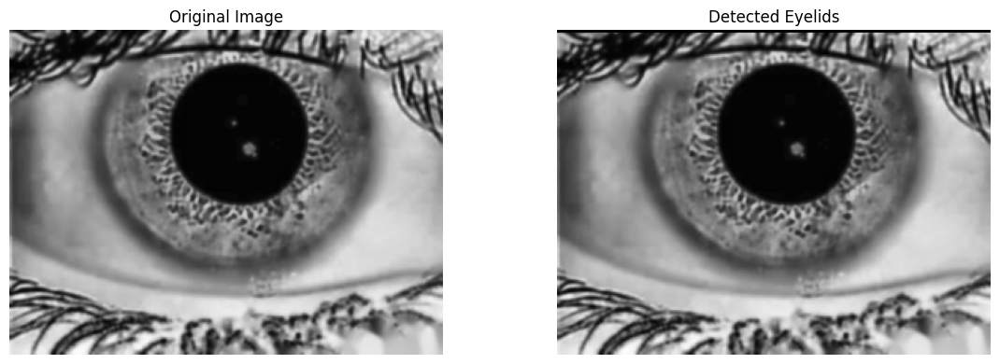

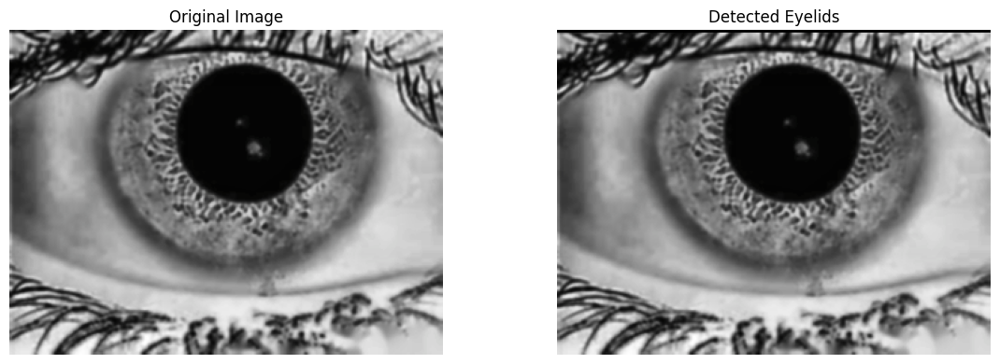

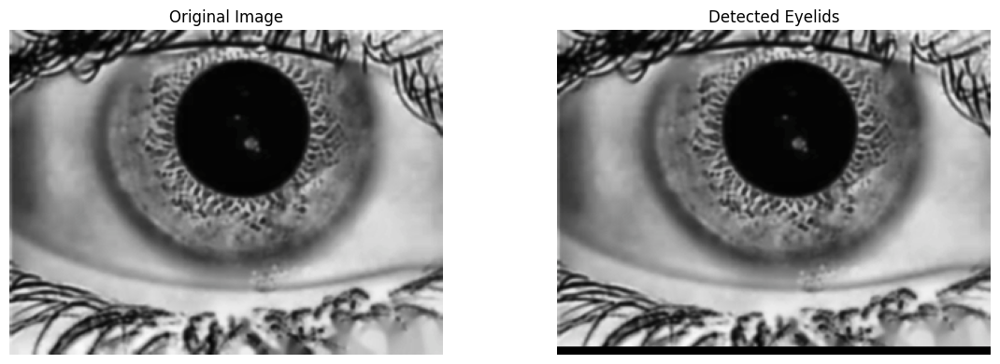

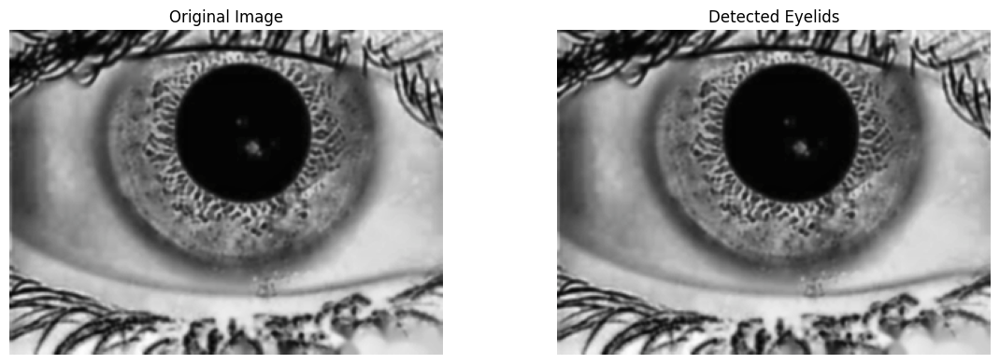

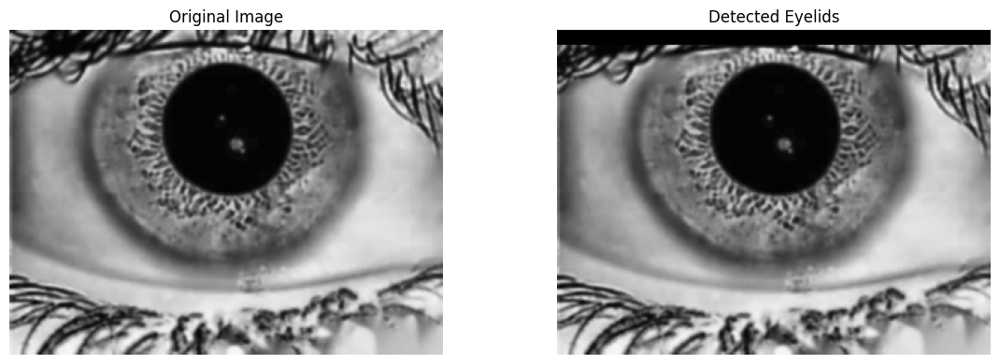

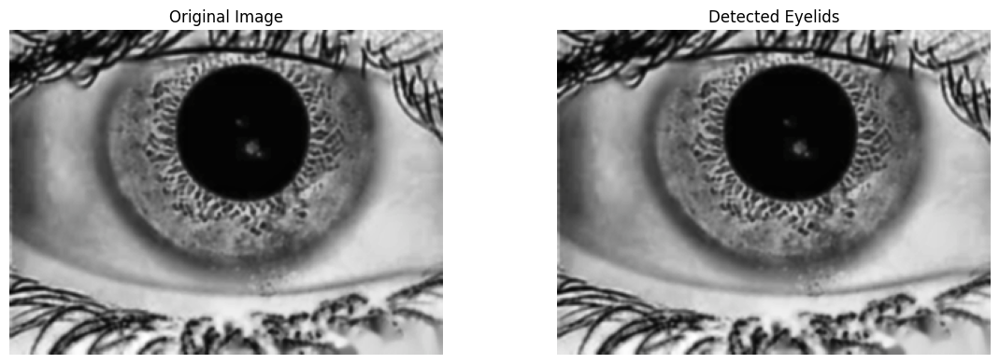

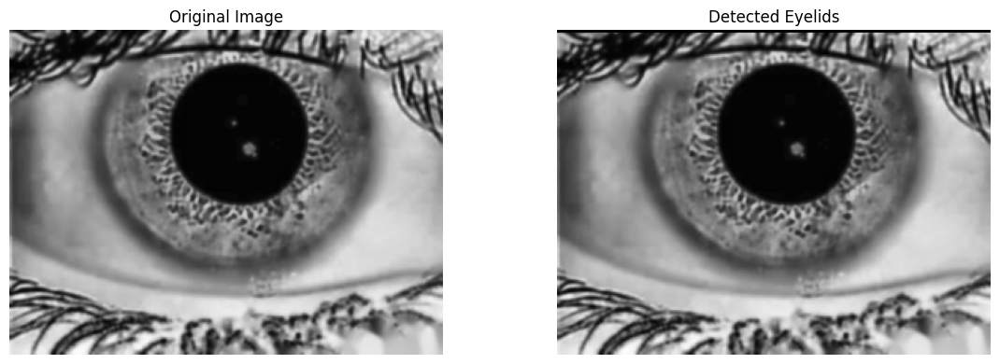

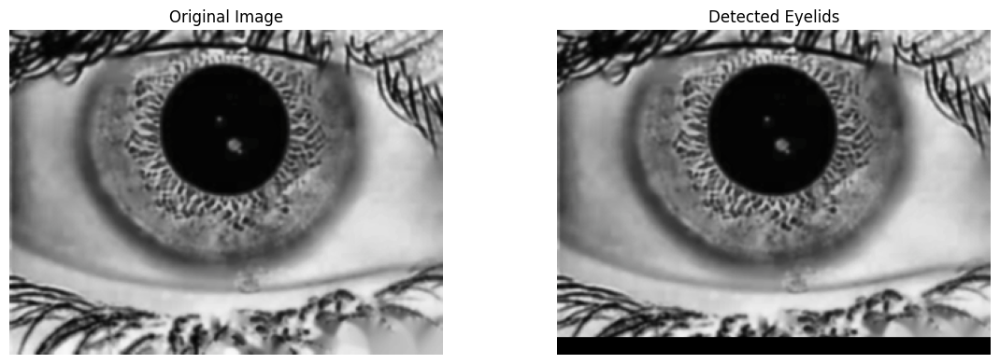

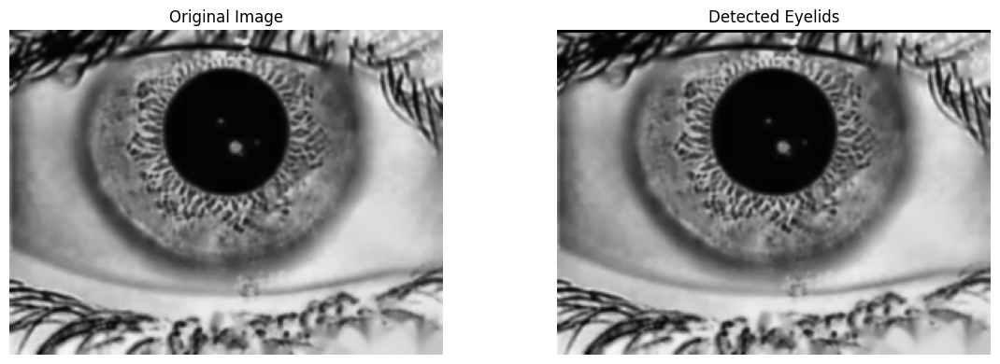

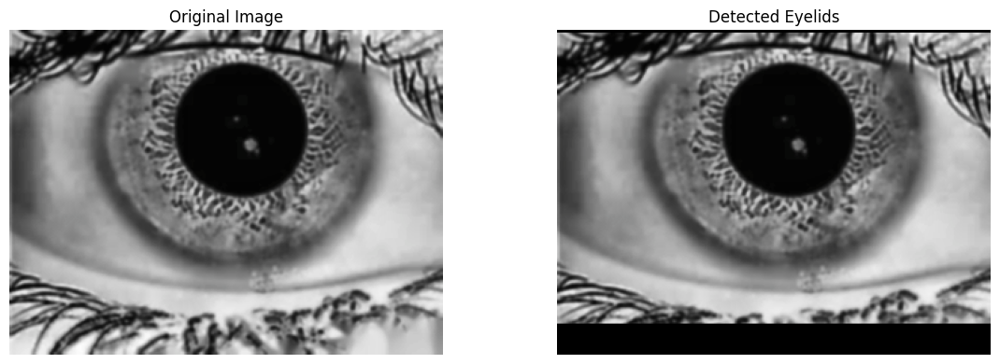

In [60]:
def visualize_eyelid_detection(image, iris):
    output, edges = detect_eyelids(image.copy(), iris)

    plt.figure(figsize=(12, 4))

    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(output, cmap='gray')
    plt.title("Detected Eyelids")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


test_images = df_images[df_images['Subject'] == "006"]

for index, row in test_images.iterrows():
    image = row['Enhanced_Image']
    iris = row['Pupil']
    visualize_eyelid_detection(image, iris)

# Apply detect_eyelids to all images in the DataFrame
#df_images['Eyelid_Image'], df_images['Eyelid_Edges'] = zip(*df_images.apply(lambda row: detect_eyelids(row['Enhanced_Image'].copy(), row['Pupil']), axis=1))


##Iris Normalization

Utilize Daugman’s rubber sheet mapping to transform the
iris image from Cartesian to polar coordinates.


In [183]:
import numpy as np
def daugman_rubber_sheet(image, pupil, iris_radius):
    if pupil is None:
        return None
    pupil_x, pupil_y, pupil_radius = pupil
    h, w = image.shape[:2]
    polar_image = np.zeros((iris_radius, 360, 3), dtype=np.uint8)

    max_distance = 0
    for y in range(h):
        for x in range(w):
            distance = int(np.sqrt((x - pupil_x)**2 + (y - pupil_y)**2))
            if pupil_radius <= distance < pupil_radius + iris_radius:  # Adjust the threshold
                angle = np.degrees(np.arctan2(y - pupil_y, x - pupil_x))
                angle = (angle + 360) % 360
                radius = int(distance - pupil_radius)
                polar_image[radius, int(angle)] = image[y, x]
                max_distance = max(max_distance, radius)
    return polar_image

test_images = df_images
iris_radius = 40
test_images['Polar_Image'] = test_images.apply(lambda row: daugman_rubber_sheet(row['Enhanced_Image'], row['Pupil'], iris_radius), axis=1)

In [184]:
test_images['Polar_Image'].describe()

,Polar_Image
count,1784
unique,1784
top,"[[[97, 97, 97], [99, 99, 99], [100, 100, 100],..."
freq,1


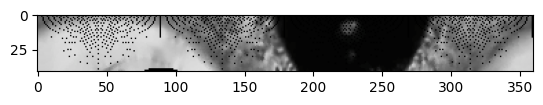

In [185]:
plt.imshow(test_images['Polar_Image'].iloc[0])

In [198]:
df_images = test_images

In [199]:
import pickle
with open('/content/drive/MyDrive/Sanya/DID-AEZ-12/df_images.pkl', 'wb') as file:
    pickle.dump(df_images, file)

In [1]:
import pickle
with open('/content/drive/MyDrive/Sanya/DID-AEZ-12/df_images.pkl', 'rb') as file:
    df_images = pickle.load(file)

In [2]:
df_images.head()

,Subject,Sample,L/R,Image,Image_no_reflection,Enhanced_Image,CHT_Image,Edges,Pupil,Iris,Eyelid_Image,Eyelid_Edges,Polar_Image,Subject_Label
13,009,07,L,"[[[253, 253, 253], [197, 197, 197], [190, 190,...","[[[197, 197, 197], [197, 197, 197], [190, 190,...","[[[192, 192, 192], [192, 192, 192], [189, 189,...","[[[192, 192, 192], [192, 192, 192], [189, 189,...","[[0.0, 24.0, 30.0, 234.0, 1536.0, 4248.0, 7098...","[172, 160, 41]",None,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[[97, 97, 97], [99, 99, 99], [100, 100, 100],...",7
14,009,05,L,"[[[253, 253, 253], [194, 194, 194], [193, 193,...","[[[196, 196, 196], [194, 194, 194], [193, 193,...","[[[189, 189, 189], [189, 189, 189], [185, 185,...","[[[189, 189, 189], [189, 189, 189], [185, 185,...","[[0.0, 3126.0, 5322.0, 6858.0, 8334.0, 9420.0,...","[122, 125, 59]",None,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[[95, 95, 95], [115, 115, 115], [128, 128, 12...",7
15,009,01,L,"[[[250, 250, 250], [203, 203, 203], [199, 199,...","[[[199, 199, 199], [200, 200, 200], [199, 199,...","[[[200, 200, 200], [200, 200, 200], [200, 200,...","[[[200, 200, 200], [200, 200, 200], [200, 200,...","[[0.0, 8856.0, 15108.0, 16908.0, 14118.0, 7962...",None,None,"[[[200, 200, 200], [200, 200, 200], [200, 200,...",[],None,7
16,009,08,L,"[[[254, 254, 254], [195, 195, 195], [194, 194,...","[[[196, 196, 196], [195, 195, 195], [194, 194,...","[[[188, 188, 188], [188, 188, 188], [181, 181,...","[[[188, 188, 188], [188, 188, 188], [181, 181,...","[[0.0, 3816.0, 6690.0, 6570.0, 3024.0, 2046.0,...","[131, 107, 59]",None,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[[65, 65, 65], [58, 58, 58], [63, 63, 63], [7...",7
17,009,09,L,"[[[251, 251, 251], [200, 200, 200], [204, 204,...","[[[200, 200, 200], [200, 200, 200], [204, 204,...","[[[205, 205, 205], [207, 207, 207], [207, 207,...","[[[205, 205, 205], [207, 207, 207], [207, 207,...","[[0.0, 0.0, 0.0, 0.0, 192.0, 1194.0, 3432.0, 6...",None,None,"[[[205, 205, 205], [207, 207, 207], [207, 207,...",[],None,7


In [8]:
df_images['Subject_Label'].unique()

array([  7,   8,   4,   2,   0,   3,   6,   5,   1,  14,  12,   9,  11,
        13,  15,  16,  10,  17,  18,  24,  26,  19,  23,  27,  25,  22,
        28,  20,  21,  32,  38,  30,  37,  29,  34,  33,  31,  36,  35,
        40,  44,  46,  45,  43,  42,  48,  47,  41,  39,  53,  52,  50,
        51,  58,  56,  54,  49,  55,  57,  67,  62,  64,  66,  63,  61,
        68,  60,  65,  59,  73,  69,  78,  76,  74,  71,  72,  70,  75,
        77,  85,  88,  82,  79,  80,  87,  81,  84,  83,  86,  90,  94,
        98,  93,  91,  96,  97,  95,  92,  89, 104,  99, 101, 106, 102,
       105, 103, 100, 108, 107, 114, 112, 118, 115, 117, 110, 111, 109,
       113, 116, 125, 123, 120, 124, 126, 122, 127, 128, 119, 121, 138,
       130, 137, 136, 134, 135, 131, 133, 129, 132, 142, 148, 144, 140,
       147, 145, 141, 146, 143, 139, 150, 154, 158, 157, 149, 151, 152,
       155, 153, 156, 162, 159, 165, 168, 160, 161, 167, 166, 163, 164,
       175, 174, 172, 170, 177, 178, 173, 176, 171, 169, 186, 18

#Part 2

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import cv2
import seaborn as sns

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def prepare_data(df_images, image_type='CHT_Image', target_size=(128, 128)):

    images = []
    labels = []

    for idx, row in df_images.iterrows():
        img = row[image_type]
        if img is not None:
            img = cv2.resize(img, target_size)
            img = img.astype('float32') / 255.0
            if len(img.shape) == 2:
                img = np.expand_dims(img, axis=-1)

            images.append(img)
            labels.append(row['Subject_Label'])

    X = np.array(images)
    y = np.array(labels)

    return X, y

def visualize_feature_maps(model, img, layer_name):
    try:
        target_layer = model.get_layer(layer_name)
    except ValueError:
        print(f"Layer '{layer_name}' not found in model. Available layers are:")
        for layer in model.layers:
            print(f"- {layer.name}")
        return
    activation_model = Model(inputs=model.input, outputs=target_layer.output)
    if len(img.shape) == 3:
        img = np.expand_dims(img, axis=0)
    activations = activation_model.predict(img)
    if len(activations.shape) == 4:
        n_features = min(16, activations.shape[3])
        plt.figure(figsize=(12, 8))
        for i in range(n_features):
            plt.subplot(4, 4, i+1)
            plt.imshow(activations[0, :, :, i], cmap='viridis')
            plt.title(f'Feature Map {i+1}')
            plt.axis('off')

        plt.tight_layout()
        plt.suptitle(f'Feature Maps for Layer: {layer_name}')
        plt.subplots_adjust(top=0.9)
        plt.show()
    elif len(activations.shape) == 2:
        plt.figure(figsize=(12, 6))
        plt.bar(range(min(16, activations.shape[1])), activations[0, :min(16, activations.shape[1])])
        plt.title(f'Activations for Dense Layer: {layer_name}')
        plt.xlabel('Neuron Index')
        plt.ylabel('Activation Value')
        plt.show()
    else:
        print(f"Unexpected activation shape: {activations.shape}")

# Build CNN model with different configurations
def build_cnn_model(input_shape, num_classes, config='basic'):
    model = Sequential()

    if config == 'basic':
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape, name='conv1'))
        model.add(MaxPooling2D((2, 2), name='pool1'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2'))
        model.add(MaxPooling2D((2, 2), name='pool2'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu', name='fc1'))
        model.add(Dense(num_classes, activation='softmax', name='output'))

    elif config == 'medium':
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape, name='conv1'))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv2'))
        model.add(MaxPooling2D((2, 2), name='pool1'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv3'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv4'))
        model.add(MaxPooling2D((2, 2), name='pool2'))
        model.add(Flatten())
        model.add(Dense(256, activation='relu', name='fc1'))
        model.add(Dropout(0.5))
        model.add(Dense(128, activation='relu', name='fc2'))
        model.add(Dense(num_classes, activation='softmax', name='output'))

    elif config == 'complex':
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape, name='conv1'))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv2'))
        model.add(MaxPooling2D((2, 2), name='pool1'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv3'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv4'))
        model.add(MaxPooling2D((2, 2), name='pool2'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv5'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv6'))
        model.add(MaxPooling2D((2, 2), name='pool3'))
        model.add(Flatten())
        model.add(Dense(512, activation='relu', name='fc1'))
        model.add(Dropout(0.5))
        model.add(Dense(256, activation='relu', name='fc2'))
        model.add(Dropout(0.3))
        model.add(Dense(num_classes, activation='softmax', name='output'))

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

def train_and_evaluate_models(df_images, image_types=['CHT_Image', 'Polar_Image']):
    results = {}
    configurations = ['medium', 'complex']

    for img_type in image_types:
        print(f"\n--- Processing {img_type} ---")
        X, y = prepare_data(df_images, image_type=img_type)
        label_encoder = LabelEncoder()
        y_encoded = label_encoder.fit_transform(y)
        num_classes = len(np.unique(y_encoded))
        y_one_hot = to_categorical(y_encoded, num_classes=num_classes)


        X_train, X_test, y_train, y_test = train_test_split(
            X, y_one_hot, test_size=0.2, random_state=42, stratify=y_one_hot
        )

        input_shape = X_train[0].shape
        print(f"Input shape: {input_shape}")
        print(f"Number of classes: {num_classes}")

        for config in configurations:
            print(f"\nTraining {config} configuration on {img_type}...")

            model = build_cnn_model(input_shape, num_classes, config=config)

            history = model.fit(
                X_train, y_train,
                epochs=10,
                batch_size=32,
                validation_split=0.2,
                verbose=1
            )

            test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
            print(f"{config.capitalize()} configuration Test accuracy: {test_acc:.4f}")

            y_pred_prob = model.predict(X_test)
            y_pred = np.argmax(y_pred_prob, axis=1)
            y_true = np.argmax(y_test, axis=1)

            report = classification_report(y_true, y_pred, target_names=[f"Subject {i}" for i in label_encoder.classes_])
            print(report)

            results[f"{img_type}_{config}"] = {
                'model': model,
                'history': history.history,
                'test_accuracy': test_acc,
                'y_true': y_true,
                'y_pred': y_pred,
                'classification_report': report,
                'sample_image': X_test[0]  # Store a sample image for visualization
            }
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 2, 1)
            plt.plot(history.history['accuracy'])
            plt.plot(history.history['val_accuracy'])
            plt.title(f'{img_type} - {config.capitalize()} Model Accuracy')
            plt.ylabel('Accuracy')
            plt.xlabel('Epoch')
            plt.legend(['Train', 'Validation'], loc='upper left')

            plt.subplot(1, 2, 2)
            plt.plot(history.history['loss'])
            plt.plot(history.history['val_loss'])
            plt.title(f'{img_type} - {config.capitalize()} Model Loss')
            plt.ylabel('Loss')
            plt.xlabel('Epoch')
            plt.legend(['Train', 'Validation'], loc='upper left')

            plt.tight_layout()
            plt.show()

            # Confusion matrix
            plt.figure(figsize=(10, 8))
            cm = confusion_matrix(y_true, y_pred)
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                      xticklabels=[f"S{i}" for i in label_encoder.classes_],
                      yticklabels=[f"S{i}" for i in label_encoder.classes_])
            plt.title(f'{img_type} - {config.capitalize()} Confusion Matrix')
            plt.ylabel('True Label')
            plt.xlabel('Predicted Label')
            plt.tight_layout()
            plt.show()

            #visualize_feature_maps(model, X_test[0], 'conv1')

    return results


--- Processing CHT_Image ---
Input shape: (128, 128, 3)
Number of classes: 223

Training basic configuration on CHT_Image...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.0036 - loss: 5.8377 - val_accuracy: 0.0084 - val_loss: 5.4058
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.0260 - loss: 5.3671 - val_accuracy: 0.0279 - val_loss: 5.2750
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.1448 - loss: 4.3640 - val_accuracy: 0.1760 - val_loss: 4.4670
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.5518 - loss: 1.9999 - val_accuracy: 0.3631 - val_loss: 3.0377
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.8403 - loss: 0.6707 - val_accuracy: 0.4777 - val_loss: 2.6380
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.9659 - loss: 0.2057 - val_accuracy: 0.4860 - val_loss: 2.6545
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.9656 - loss: 0.1279 - val_accuracy: 0.5866 - val_loss: 2.4469
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.9915 - loss: 0.0486 - val_accuracy: 0.5615 - val_loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


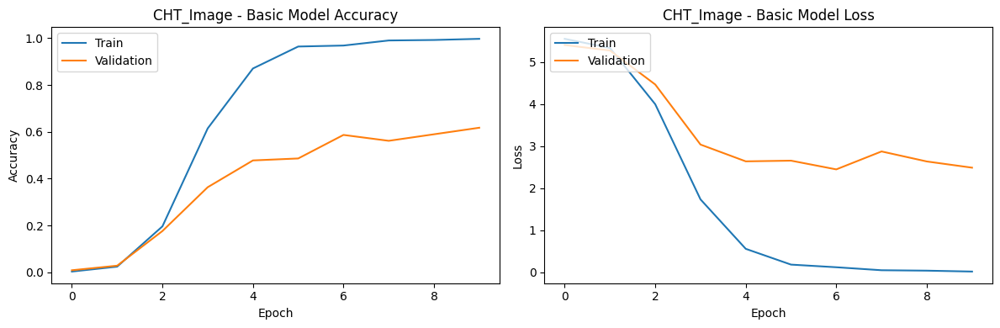

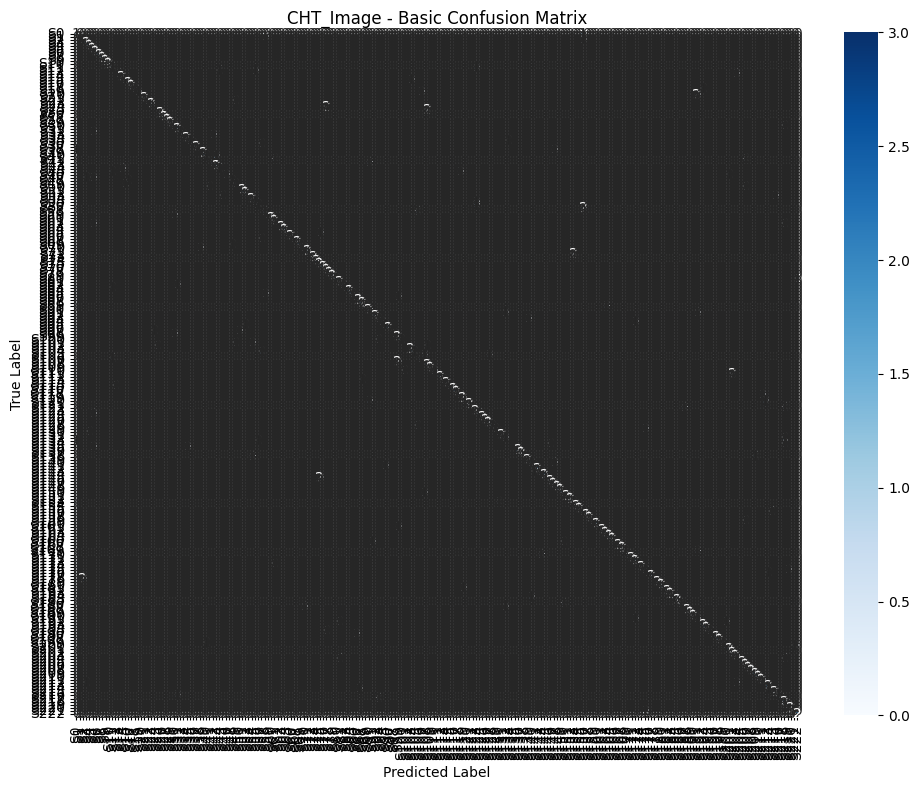

AttributeError: The layer sequential_1 has never been called and thus has no defined input.

In [16]:
results = train_and_evaluate_models(df_images, image_types=['CHT_Image', 'Polar_Image'])


--- Processing CHT_Image ---
Input shape: (128, 128, 3)
Number of classes: 223

Training medium configuration on CHT_Image...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 149s 3s/step - accuracy: 0.0038 - loss: 5.4354 - val_accuracy: 0.0000e+00 - val_loss: 5.4098
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - accuracy: 0.0129 - loss: 5.4058 - val_accuracy: 0.0000e+00 - val_loss: 5.4122
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 195s 3s/step - accuracy: 0.0046 - loss: 5.4052 - val_accuracy: 0.0000e+00 - val_loss: 5.4152
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.0026 - loss: 5.4046 - val_accuracy: 0.0000e+00 - val_loss: 5.4175
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 137s 3s/step - accuracy: 0.0026 - loss: 5.4054 - val_accuracy: 0.0000e+00 - val_loss: 5.4194
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.0051 - loss: 5.4051 - val_accuracy: 0.0000e+00 - val_loss: 5.4206
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.0039 - loss: 5.4044 - val_accuracy: 0.0000e+00 - val_loss: 5.4235
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 135s 3s/step - accuracy: 0.0058 - loss: 5.404

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Subject 0       0.00      0.00      0.00         2
   Subject 1       0.00      0.00      0.00         2
   Subject 2       0.00      0.00      0.00         2
   Subject 3       0.00      0.00      0.00         2
   Subject 4       0.00      0.00      0.00         2
   Subject 5       0.00      0.00      0.00         2
   Subject 6       0.00      0.00      0.00         2
   Subject 7       0.00      0.00      0.00         2
   Subject 8       0.00      0.00      0.00         2
   Subject 9       0.00      0.00      0.00         2
  Subject 10       0.00      0.00      0.00         2
  Subject 11       0.00      0.00      0.00         2
  Subject 12       0.00      0.00      0.00         2
  Subject 13       0.00      0.00      0.00         2
  Subject 14       0.00      0.00      0.00         2
  Subject 15       0.00      0.00      0.00         2
  Subject 16       0.00      0.00      0.00         2
  Subject 17       0.00    

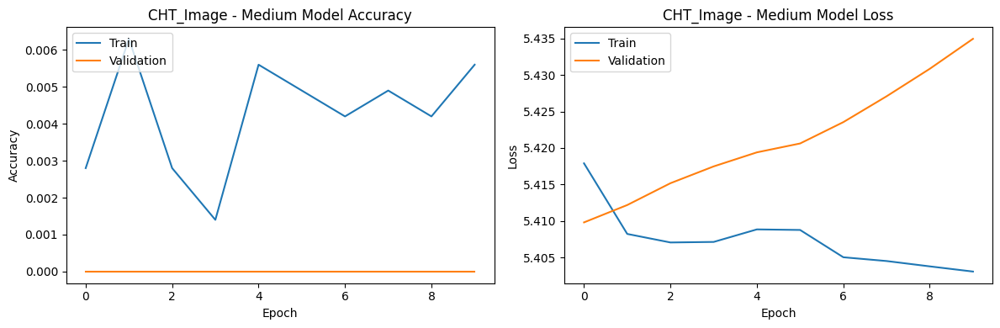

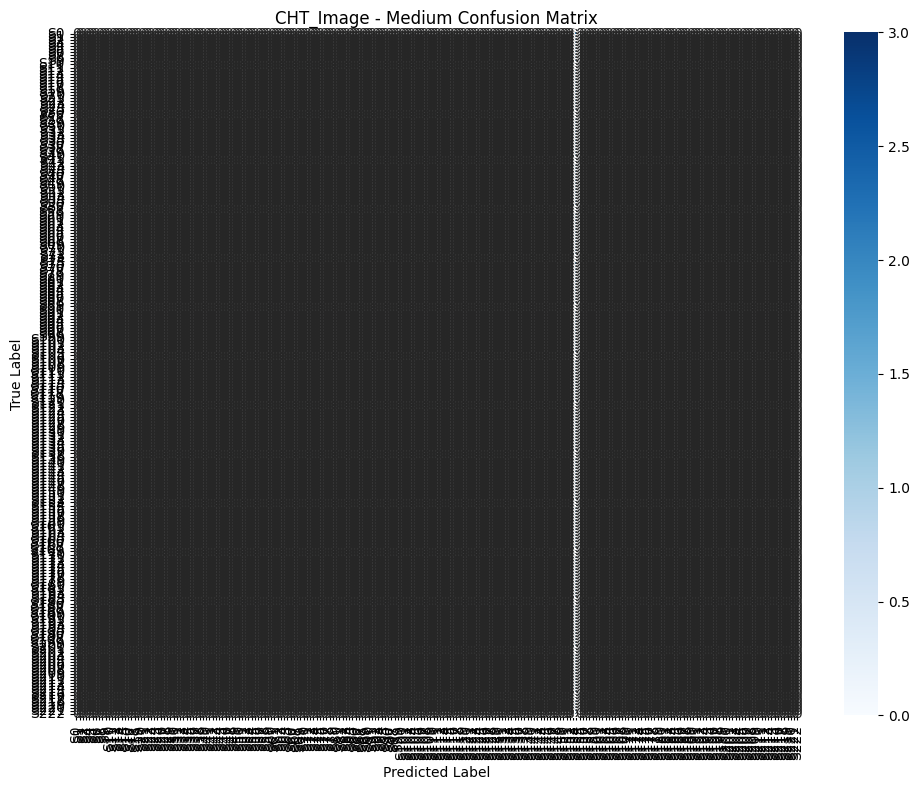


Training complex configuration on CHT_Image...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 196s 4s/step - accuracy: 0.0046 - loss: 5.4469 - val_accuracy: 0.0000e+00 - val_loss: 5.4099
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 192s 4s/step - accuracy: 0.0078 - loss: 5.4051 - val_accuracy: 0.0028 - val_loss: 5.4128
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 211s 4s/step - accuracy: 0.0097 - loss: 5.4045 - val_accuracy: 0.0028 - val_loss: 5.4160
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 191s 4s/step - accuracy: 0.0114 - loss: 5.4040 - val_accuracy: 0.0028 - val_loss: 5.4198
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 212s 4s/step - accuracy: 0.0028 - loss: 5.4036 - val_accuracy: 0.0028 - val_loss: 5.4241
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 192s 4s/step - accuracy: 0.0023 - loss: 5.4029 - val_accuracy: 0.0028 - val_loss: 5.4301
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 192s 4s/step - accuracy: 0.0038 - loss: 5.4018 - val_accuracy: 0.0028 - val_loss: 5.4384
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 192s 4s/step - accuracy: 0.0047 - loss: 5.4012 - val_accuracy: 0.0028

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Subject 0       0.00      0.00      0.00         2
   Subject 1       0.00      0.00      0.00         2
   Subject 2       0.00      0.00      0.00         2
   Subject 3       0.00      0.00      0.00         2
   Subject 4       0.00      0.00      0.00         2
   Subject 5       0.00      0.00      0.00         2
   Subject 6       0.00      0.00      0.00         2
   Subject 7       0.00      0.00      0.00         2
   Subject 8       0.00      0.00      0.00         2
   Subject 9       0.00      0.00      0.00         2
  Subject 10       0.00      0.00      0.00         2
  Subject 11       0.00      0.00      0.00         2
  Subject 12       0.00      0.00      0.00         2
  Subject 13       0.00      0.00      0.00         2
  Subject 14       0.00      0.00      0.00         2
  Subject 15       0.00      0.00      0.00         2
  Subject 16       0.00      0.00      0.00         2
  Subject 17       0.00    

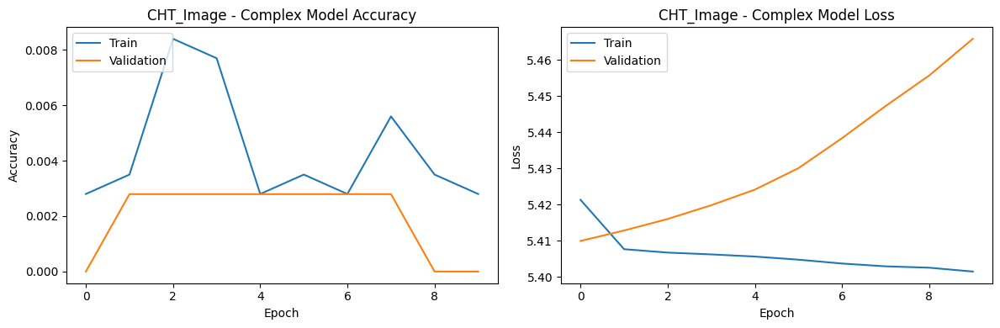

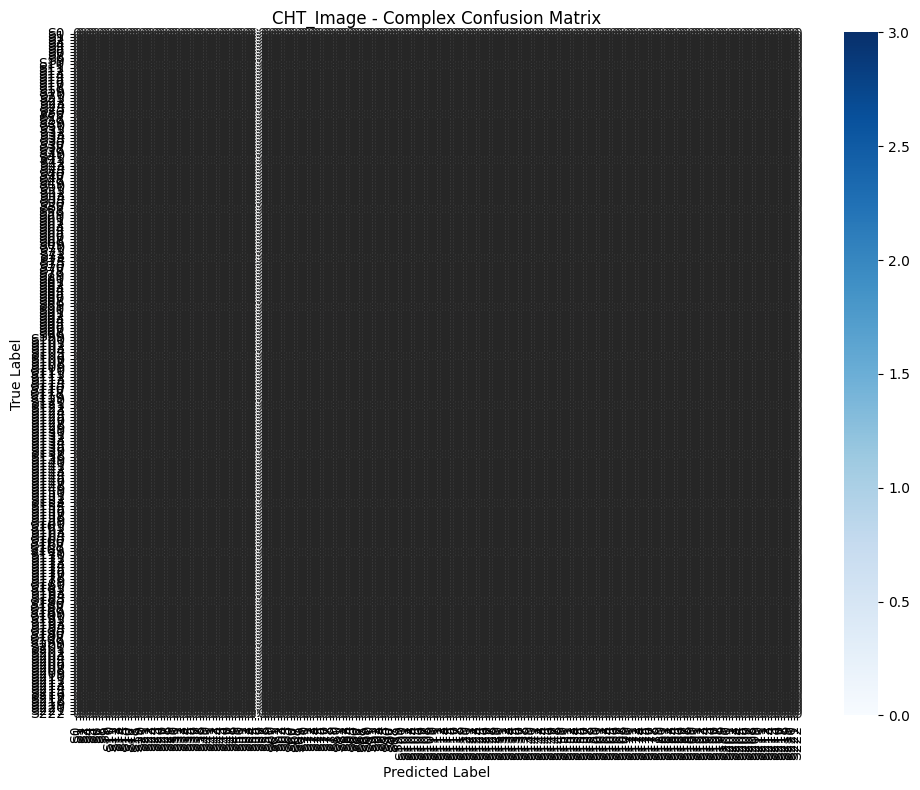


--- Processing Polar_Image ---
Input shape: (128, 128, 3)
Number of classes: 223

Training medium configuration on Polar_Image...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 112s 3s/step - accuracy: 0.0090 - loss: 5.4136 - val_accuracy: 0.0000e+00 - val_loss: 5.4095
Epoch 2/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - accuracy: 0.0110 - loss: 5.4033 - val_accuracy: 0.0000e+00 - val_loss: 5.4123
Epoch 3/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 112s 3s/step - accuracy: 0.0139 - loss: 5.4033 - val_accuracy: 0.0000e+00 - val_loss: 5.4161
Epoch 4/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.0073 - loss: 5.3969 - val_accuracy: 0.0000e+00 - val_loss: 5.4215
Epoch 5/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - accuracy: 0.0071 - loss: 5.3977 - val_accuracy: 0.0000e+00 - val_loss: 5.4306
Epoch 6/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - accuracy: 0.0072 - loss: 5.3912 - val_accuracy: 0.0000e+00 - val_loss: 5.4447
Epoch 7/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 112s 3s/step - accuracy: 0.0061 - loss: 5.3857 - val_accuracy: 0.0000e+00 - val_loss: 5.4666
Epoch 8/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/step - accuracy: 0.0074 - loss: 5.379

ValueError: Number of classes, 220, does not match size of target_names, 223. Try specifying the labels parameter

In [18]:
results = train_and_evaluate_models(df_images, image_types=['CHT_Image', 'Polar_Image'])

#Part 3


--- Processing CHT_Image ---
Input shape: (128, 128, 3)
Number of classes: 223

Training basic configuration on CHT_Image...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - accuracy: 0.0043 - loss: 5.5841 - val_accuracy: 0.0056 - val_loss: 5.3930
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - accuracy: 0.0185 - loss: 5.2701 - val_accuracy: 0.0642 - val_loss: 5.0020
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.2121 - loss: 3.8824 - val_accuracy: 0.2765 - val_loss: 3.5821
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.6642 - loss: 1.4415 - val_accuracy: 0.4721 - val_loss: 2.7224
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.9045 - loss: 0.4426 - val_accuracy: 0.5754 - val_loss: 2.3073
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.9721 - loss: 0.1290 - val_accuracy: 0.6285 - val_loss: 2.2539
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.9895 - loss: 0.0457 - val_accuracy: 0.6788 - val_loss: 1.9843
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 1.0000 - loss: 0.0077 - val_accuracy: 0.6899 - val_loss:

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


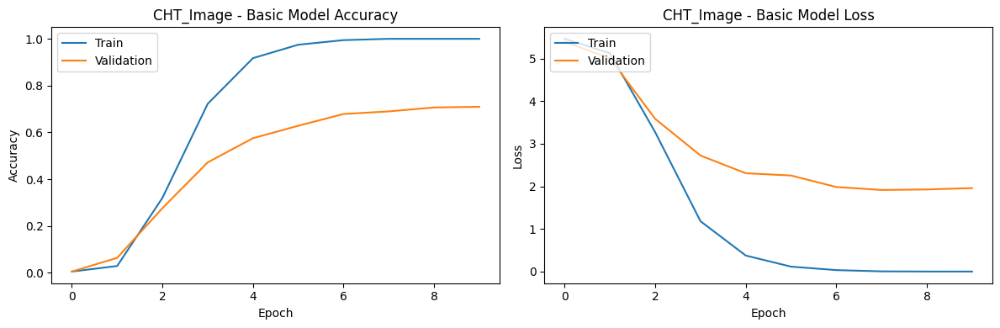

In [20]:
def build_cnn_model(input_shape, num_classes, config='basic'):
    model = Sequential()

    if config == 'basic':
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape, name='conv1'))
        model.add(MaxPooling2D((2, 2), name='pool1'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2'))
        model.add(MaxPooling2D((2, 2), name='pool2'))
        model.add(Flatten())
        model.add(Dense(128, activation='relu', name='fc1'))
        model.add(Dense(num_classes, activation='softmax', name='output'))

    elif config == 'medium':
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape, name='conv1'))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv2'))
        model.add(MaxPooling2D((2, 2), name='pool1'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv3'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv4'))
        model.add(MaxPooling2D((2, 2), name='pool2'))
        model.add(Flatten())
        model.add(Dense(256, activation='relu', name='fc1'))
        model.add(Dropout(0.5))
        model.add(Dense(128, activation='relu', name='fc2'))
        model.add(Dense(num_classes, activation='softmax', name='output'))

    elif config == 'complex':
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape, name='conv1'))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv2'))
        model.add(MaxPooling2D((2, 2), name='pool1'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv3'))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv4'))
        model.add(MaxPooling2D((2, 2), name='pool2'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv5'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv6'))
        model.add(MaxPooling2D((2, 2), name='pool3'))
        model.add(Flatten())
        model.add(Dense(512, activation='relu', name='fc1'))
        model.add(Dropout(0.5))
        model.add(Dense(256, activation='relu', name='fc2'))
        model.add(Dropout(0.3))
        model.add(Dense(num_classes, activation='softmax', name='output'))

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

def train_and_evaluate_models(df_images, image_types=['CHT_Image']):
    results = {}
    configurations = ['basic']

    for img_type in image_types:
        print(f"\n--- Processing {img_type} ---")
        X, y = prepare_data(df_images, image_type=img_type)
        label_encoder = LabelEncoder()
        y_encoded = label_encoder.fit_transform(y)
        num_classes = len(np.unique(y_encoded))
        y_one_hot = to_categorical(y_encoded, num_classes=num_classes)


        X_train, X_test, y_train, y_test = train_test_split(
            X, y_one_hot, test_size=0.2, random_state=42, stratify=y_one_hot
        )

        input_shape = X_train[0].shape
        print(f"Input shape: {input_shape}")
        print(f"Number of classes: {num_classes}")

        for config in configurations:
            print(f"\nTraining {config} configuration on {img_type}...")

            model = build_cnn_model(input_shape, num_classes, config=config)

            history = model.fit(
                X_train, y_train,
                epochs=10,
                batch_size=32,
                validation_split=0.2,
                verbose=1
            )

            test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
            print(f"{config.capitalize()} configuration Test accuracy: {test_acc:.4f}")

            y_pred_prob = model.predict(X_test)
            y_pred = np.argmax(y_pred_prob, axis=1)
            y_true = np.argmax(y_test, axis=1)

            report = classification_report(y_true, y_pred, target_names=[f"Subject {i}" for i in label_encoder.classes_])
            print(report)

            results[f"{img_type}_{config}"] = {
                'model': model,
                'history': history.history,
                'test_accuracy': test_acc,
                'y_true': y_true,
                'y_pred': y_pred,
                'classification_report': report,
                'sample_image': X_test[0]  # Store a sample image for visualization
            }
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 2, 1)
            plt.plot(history.history['accuracy'])
            plt.plot(history.history['val_accuracy'])
            plt.title(f'{img_type} - {config.capitalize()} Model Accuracy')
            plt.ylabel('Accuracy')
            plt.xlabel('Epoch')
            plt.legend(['Train', 'Validation'], loc='upper left')

            plt.subplot(1, 2, 2)
            plt.plot(history.history['loss'])
            plt.plot(history.history['val_loss'])
            plt.title(f'{img_type} - {config.capitalize()} Model Loss')
            plt.ylabel('Loss')
            plt.xlabel('Epoch')
            plt.legend(['Train', 'Validation'], loc='upper left')

            plt.tight_layout()
            plt.show()

    return model, results
model, results = train_and_evaluate_models(df_images, image_types=['CHT_Image'])

In [7]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

def extract_features(model, images, layer_name='fc1'):
    feature_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    features = feature_model.predict(images)
    return features

def compute_match_scores(query_features, gallery_features, method='cosine'):
    if method == 'cosine':
        if len(query_features.shape) == 1:
            query_features = query_features.reshape(1, -1)
        scores = cosine_similarity(query_features, gallery_features)[0]

    elif method == 'euclidean':
        scores = np.zeros(gallery_features.shape[0])
        for i in range(gallery_features.shape[0]):
            scores[i] = -np.linalg.norm(query_features - gallery_features[i])

    elif method == 'normalized_euclidean':
        scores = np.zeros(gallery_features.shape[0])
        for i in range(gallery_features.shape[0]):
            diff = query_features - gallery_features[i]
            scores[i] = -np.sqrt(np.sum((diff ** 2) / np.var(diff)))

    return scores

def generate_ranking_list(match_scores, gallery_ids):
    ranking_df = pd.DataFrame({
        'gallery_id': gallery_ids,
        'match_score': match_scores
    })
    ranking_df = ranking_df.sort_values(by='match_score', ascending=False)

    ranking_df['rank'] = range(1, len(ranking_df) + 1)

    return ranking_df

def evaluate_matching_performance(ranking_df, query_id, k_values=[1, 5, 10]):
    results = {}

    true_match_rank = ranking_df[ranking_df['gallery_id'] == query_id]['rank'].values

    if len(true_match_rank) > 0:
        true_match_rank = true_match_rank[0]
        results['true_match_rank'] = true_match_rank

        for k in k_values:
            results[f'rank_{k}'] = 1 if true_match_rank <= k else 0
    else:
        results['true_match_rank'] = None
        for k in k_values:
            results[f'rank_{k}'] = 0

    return results

def visualize_top_matches(query_image, gallery_images, ranking_df, gallery_ids, top_k=5):

    top_matches = ranking_df.head(top_k)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, top_k + 1, 1)
    plt.imshow(query_image, cmap='gray')
    plt.title('Query Image')
    plt.axis('off')

    for i, (_, row) in enumerate(top_matches.iterrows()):
        gallery_idx = np.where(gallery_ids == row['gallery_id'])[0][0]

        plt.subplot(1, top_k + 1, i + 2)
        plt.imshow(gallery_images[gallery_idx], cmap='gray')
        plt.title(f"Rank {i+1}\nID: {row['gallery_id']}\nScore: {row['match_score']:.3f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

def compute_cumulative_match_curve(all_results, max_rank=20):

    cmc = np.zeros(max_rank)
    n_queries = len(all_results)
    for result in all_results:
        true_match_rank = result['true_match_rank']
        if true_match_rank is not None and true_match_rank <= max_rank:
            cmc[true_match_rank-1:] += 1

    cmc = cmc / n_queries

    return cmc

def plot_cmc(cmc, title='Cumulative Match Curve'):

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(cmc) + 1), cmc, marker='o')
    plt.xlabel('Rank')
    plt.ylabel('Recognition Rate')
    plt.title(title)
    plt.grid(True)
    plt.xticks(np.arange(1, len(cmc) + 1, step=1))
    plt.ylim(0, 1.05)
    plt.show()

def recognize_iris(query_image, database_images, database_ids, model, similarity_method='cosine'):
    query_features = extract_features(model, np.expand_dims(query_image, axis=0))[0]
    database_features = extract_features(model, database_images)
    match_scores = compute_match_scores(query_features, database_features, method=similarity_method)
    ranking_df = generate_ranking_list(match_scores, database_ids)
    return ranking_df

In [8]:
use_basic_model=True
image_type = 'CHT_Image'
X, y = prepare_data(df_images, image_type=image_type)

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
from tensorflow.keras.utils import to_categorical
num_classes = len(np.unique(y_encoded))
y_one_hot = to_categorical(y_encoded, num_classes=num_classes)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_one_hot, test_size=0.2, random_state=42, stratify=y_one_hot
)
y_test_original = np.argmax(y_test, axis=1)
input_shape = X_train[0].shape
model_config = 'basic' if use_basic_model else 'medium'
model = build_cnn_model(input_shape, num_classes, config=model_config)

history = model.fit(
    X_train, y_train,
    epochs=10,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)
print("Extracting features...")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.0023 - loss: 5.6729 - val_accuracy: 0.0000e+00 - val_loss: 5.4024
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - accuracy: 0.0135 - loss: 5.3704 - val_accuracy: 0.0251 - val_loss: 5.2768
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.0893 - loss: 4.7163 - val_accuracy: 0.1592 - val_loss: 4.5109
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.4649 - loss: 2.5388 - val_accuracy: 0.3771 - val_loss: 3.1974
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.7490 - loss: 0.9514 - val_accuracy: 0.4609 - val_loss: 3.0995
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.9148 - loss: 0.3314 - val_accuracy: 0.5196 - val_loss: 2.7080
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.9855 - loss: 0.0874 - val_accuracy: 0.5754 - val_loss: 2.8019
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.9889 - loss: 0.0347 - val_accuracy: 0.6145 - val_l

AttributeError: The layer sequential_1 has never been called and thus has no defined input.

In [ ]:
train_features = extract_features(model, X_train)
test_features = extract_features(model, X_test)
print("Computing match scores and evaluating performance...")
all_results = []

for i in range(len(X_test)):
    query_features = test_features[i]
    query_id = y_test_original[i]

    match_scores = compute_match_scores(query_features, train_features)

    ranking_df = generate_ranking_list(match_scores, np.argmax(y_train, axis=1))

    results = evaluate_matching_performance(ranking_df, query_id)
    all_results.append(results)

    visualize_top_matches(X_test[i], X_train, ranking_df, np.argmax(y_train, axis=1))

    rank_1_acc = np.mean([result['rank_1'] for result in all_results])
    rank_5_acc = np.mean([result['rank_5'] for result in all_results])
    rank_10_acc = np.mean([result['rank_10'] for result in all_results])

    print(f"Rank-1 Accuracy: {rank_1_acc:.4f}")
    print(f"Rank-5 Accuracy: {rank_5_acc:.4f}")
    print(f"Rank-10 Accuracy: {rank_10_acc:.4f}")

    cmc = compute_cumulative_match_curve(all_results)
    plot_cmc(cmc, title=f'Cumulative Match Curve - {model_config.capitalize()} Model')

    print('model', model,'rank_1_acc', rank_1_acc, 'rank_5_acc', rank_5_acc, 'rank_10_acc', rank_10_acc, 'cmc', cmc,'all_results', all_results)

#Part 4

In [22]:
import numpy as np
import pandas as pd
import time
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

def highest_rank_fusion(rank_lists, epsilon_factor=1000):
    all_gallery_ids = set()
    for rank_list in rank_lists:
        all_gallery_ids.update(rank_list['gallery_id'].values)
    all_gallery_ids = list(all_gallery_ids)
    result = {
        'gallery_id': [],
        'min_rank': [],
        'fused_rank': []
    }
    epsilons = []
    for i, rank_list in enumerate(rank_lists):
        rank_sum = rank_list['rank'].sum()
        epsilon = rank_sum / epsilon_factor
        epsilons.append(epsilon)

    for gid in all_gallery_ids:
        min_rank = float('inf')
        min_rank_with_epsilon = float('inf')

        for i, rank_list in enumerate(rank_lists):
            if gid in rank_list['gallery_id'].values:
                rank = rank_list.loc[rank_list['gallery_id'] == gid, 'rank'].values[0]
                if rank < min_rank:
                    min_rank = rank
                rank_with_epsilon = rank + epsilons[i]
                if rank_with_epsilon < min_rank_with_epsilon:
                    min_rank_with_epsilon = rank_with_epsilon

        result['gallery_id'].append(gid)
        result['min_rank'].append(min_rank)
        result['fused_rank'].append(min_rank_with_epsilon)
    fused_df = pd.DataFrame(result)
    fused_df = fused_df.sort_values(by='fused_rank')

    # Assign new ranks
    fused_df['rank'] = range(1, len(fused_df) + 1)

    return fused_df[['gallery_id', 'rank']]

def borda_count_fusion(rank_lists):
    all_gallery_ids = set()
    for rank_list in rank_lists:
        all_gallery_ids.update(rank_list['gallery_id'].values)
    all_gallery_ids = list(all_gallery_ids)
    result = {
        'gallery_id': [],
        'borda_sum': []
    }
    for gid in all_gallery_ids:
        borda_sum = 0
        for rank_list in rank_lists:
            if gid in rank_list['gallery_id'].values:
                rank = rank_list.loc[rank_list['gallery_id'] == gid, 'rank'].values[0]
                borda_sum += rank

        result['gallery_id'].append(gid)
        result['borda_sum'].append(borda_sum)
    fused_df = pd.DataFrame(result)
    fused_df = fused_df.sort_values(by='borda_sum')

    # Assign new ranks
    fused_df['rank'] = range(1, len(fused_df) + 1)

    return fused_df[['gallery_id', 'rank']]

def logistic_regression_fusion(rank_lists, ground_truth_data, test_queries):
    X_train = []
    y_train = []

    for idx, row in ground_truth_data.iterrows():
        query_id = row['query_id']
        true_gallery_id = row['true_gallery_id']
        for gid in set().union(*[set(rl['gallery_id']) for rl in rank_lists]):
            feature_vector = []
            for rank_list in rank_lists:
                if gid in rank_list['gallery_id'].values:
                    rank = rank_list.loc[rank_list['gallery_id'] == gid, 'rank'].values[0]
                else:
                    rank = len(rank_list) + 1
                feature_vector.append(rank)

            X_train.append(feature_vector)
            y_train.append(1 if gid == true_gallery_id else 0)
    lr_model = LogisticRegression(max_iter=1000)
    lr_model.fit(X_train, y_train)
    weights = lr_model.coef_[0]
    result = {
        'gallery_id': [],
        'weighted_sum': []
    }
    all_gallery_ids = set()
    for rank_list in rank_lists:
        all_gallery_ids.update(rank_list['gallery_id'].values)
    all_gallery_ids = list(all_gallery_ids)
    for gid in all_gallery_ids:
        feature_vector = []
        for rank_list in rank_lists:
            if gid in rank_list['gallery_id'].values:
                rank = rank_list.loc[rank_list['gallery_id'] == gid, 'rank'].values[0]
            else:
                rank = len(rank_list) + 1
            feature_vector.append(rank)
        weighted_sum = np.sum(weights * np.array(feature_vector))

        result['gallery_id'].append(gid)
        result['weighted_sum'].append(weighted_sum)
    fused_df = pd.DataFrame(result)
    fused_df = fused_df.sort_values(by='weighted_sum')

    fused_df['rank'] = range(1, len(fused_df) + 1)

    return fused_df[['gallery_id', 'rank']]

def evaluate_fusion_performance(fused_df, true_id, k_values=[1, 5, 10]):
    results = {}
    true_match_rank = fused_df[fused_df['gallery_id'] == true_id]['rank'].values

    if len(true_match_rank) > 0:
        true_match_rank = true_match_rank[0]
        results['true_match_rank'] = true_match_rank
        for k in k_values:
            results[f'rank_{k}'] = 1 if true_match_rank <= k else 0
    else:
        results['true_match_rank'] = None
        for k in k_values:
            results[f'rank_{k}'] = 0

    return results

def compare_fusion_methods(df_images, num_classifiers=3, use_basic_model=True):
    image_types = ['CHT_Image', 'Polar_Image', 'Edges'][:num_classifiers]

    # Initialize results
    results = {
        'highest_rank': {'time': 0, 'rank_1': [], 'rank_5': [], 'rank_10': []},
        'borda_count': {'time': 0, 'rank_1': [], 'rank_5': [], 'rank_10': []},
        'logistic_regression': {'time': 0, 'rank_1': [], 'rank_5': [], 'rank_10': []}
    }
    classifiers_data = []
    for img_type in image_types:
        print(f"\nProcessing {img_type} for classifier")
        X, y = prepare_data(df_images, image_type=img_type)
        from sklearn.preprocessing import LabelEncoder
        label_encoder = LabelEncoder()
        y_encoded = label_encoder.fit_transform(y)
        from tensorflow.keras.utils import to_categorical
        num_classes = len(np.unique(y_encoded))
        y_one_hot = to_categorical(y_encoded, num_classes=num_classes)
        X_train, X_test, y_train, y_test, y_encoded_train, y_encoded_test = train_test_split(
            X, y_one_hot, y_encoded, test_size=0.2, random_state=42, stratify=y_one_hot
        )

        input_shape = X_train[0].shape
        model = build_cnn_model(input_shape, num_classes, config='basic' if use_basic_model else 'medium')

        history = model.fit(
            X_train, y_train,
            epochs=5,  # Reduced for demonstration
            batch_size=32,
            validation_split=0.2,
            verbose=1
        )

        train_features = extract_features(model, X_train)
        test_features = extract_features(model, X_test)

        classifiers_data.append({
            'image_type': img_type,
            'model': model,
            'X_train': X_train,
            'y_train': y_train,
            'y_encoded_train': y_encoded_train,
            'X_test': X_test,
            'y_test': y_test,
            'y_encoded_test': y_encoded_test,
            'train_features': train_features,
            'test_features': test_features
        })

    rank_lists_per_query = []
    query_true_ids = []

    num_test_samples = len(classifiers_data[0]['X_test'])
    for test_idx in range(num_test_samples):
        query_rank_lists = []

        true_id = classifiers_data[0]['y_encoded_test'][test_idx]
        query_true_ids.append(true_id)

        for classifier_idx, classifier_data in enumerate(classifiers_data):
            query_features = classifier_data['test_features'][test_idx]
            match_scores = compute_match_scores(query_features, classifier_data['train_features'])
            ranking_df = generate_ranking_list(match_scores, classifier_data['y_encoded_train'])
            query_rank_lists.append(ranking_df)
        rank_lists_per_query.append(query_rank_lists)
    ground_truth = pd.DataFrame({
        'query_id': range(len(query_true_ids)),
        'true_gallery_id': query_true_ids
    })

    train_size = int(0.8 * len(ground_truth))
    ground_truth_train = ground_truth.iloc[:train_size]
    ground_truth_test = ground_truth.iloc[train_size:]

    for query_idx, (rank_lists, true_id) in enumerate(zip(rank_lists_per_query, query_true_ids)):
        if query_idx < train_size:
            continue
        start_time = time.time()
        highest_rank_df = highest_rank_fusion(rank_lists)
        results['highest_rank']['time'] += time.time() - start_time
        perf = evaluate_fusion_performance(highest_rank_df, true_id)
        results['highest_rank']['rank_1'].append(perf['rank_1'])
        results['highest_rank']['rank_5'].append(perf['rank_5'])
        results['highest_rank']['rank_10'].append(perf['rank_10'])
        start_time = time.time()
        borda_count_df = borda_count_fusion(rank_lists)
        results['borda_count']['time'] += time.time() - start_time
        perf = evaluate_fusion_performance(borda_count_df, true_id)
        results['borda_count']['rank_1'].append(perf['rank_1'])
        results['borda_count']['rank_5'].append(perf['rank_5'])
        results['borda_count']['rank_10'].append(perf['rank_10'])
        if query_idx == train_size:
            start_time = time.time()
            train_rank_lists = rank_lists_per_query[:train_size]
            lr_model = LogisticRegression(max_iter=1000)
            X_train_lr = []
            y_train_lr = []

            for train_idx, (train_rank_list, train_true_id) in enumerate(zip(train_rank_lists, query_true_ids[:train_size])):

                all_gallery_ids = set()
                for rl in train_rank_list:
                    all_gallery_ids.update(rl['gallery_id'].values)

                for gid in all_gallery_ids:
                    feature_vector = []
                    for rl in train_rank_list:
                        if gid in rl['gallery_id'].values:
                            rank = rl.loc[rl['gallery_id'] == gid, 'rank'].values[0]
                        else:
                            rank = len(rl) + 1
                        feature_vector.append(rank)

                    X_train_lr.append(feature_vector)
                    y_train_lr.append(1 if gid == train_true_id else 0)

            lr_model.fit(X_train_lr, y_train_lr)
            weights = lr_model.coef_[0]
            lr_training_time = time.time() - start_time
            results['logistic_regression']['time'] += lr_training_time

        start_time = time.time()
        all_gallery_ids = set()
        for rl in rank_lists:
            all_gallery_ids.update(rl['gallery_id'].values)
        weighted_results = {
            'gallery_id': [],
            'weighted_sum': []
        }

        for gid in all_gallery_ids:
            feature_vector = []
            for rl in rank_lists:
                if gid in rl['gallery_id'].values:
                    rank = rl.loc[rl['gallery_id'] == gid, 'rank'].values[0]
                else:
                    rank = len(rl) + 1
                feature_vector.append(rank)
            weighted_sum = np.sum(weights * np.array(feature_vector))

            weighted_results['gallery_id'].append(gid)
            weighted_results['weighted_sum'].append(weighted_sum)

        weighted_df = pd.DataFrame(weighted_results)
        weighted_df = weighted_df.sort_values(by='weighted_sum')

        weighted_df['rank'] = range(1, len(weighted_df) + 1)

        lr_fused_df = weighted_df[['gallery_id', 'rank']]

        results['logistic_regression']['time'] += time.time() - start_time

        perf = evaluate_fusion_performance(lr_fused_df, true_id)
        results['logistic_regression']['rank_1'].append(perf['rank_1'])
        results['logistic_regression']['rank_5'].append(perf['rank_5'])
        results['logistic_regression']['rank_10'].append(perf['rank_10'])

    for method in results:
        results[method]['avg_rank_1'] = np.mean(results[method]['rank_1'])
        results[method]['avg_rank_5'] = np.mean(results[method]['rank_5'])
        results[method]['avg_rank_10'] = np.mean(results[method]['rank_10'])
        results[method]['avg_time_ms'] = results[method]['time'] * 1000 / len(results[method]['rank_1'])

    print("\n--- Fusion Methods Comparison ---")
    print(f"{'Method':<20} {'Rank-1 Acc':<12} {'Rank-5 Acc':<12} {'Rank-10 Acc':<12} {'Avg Time (ms)':<15}")
    print("-" * 70)

    for method in results:
        method_name = ' '.join(word.capitalize() for word in method.split('_'))
        print(f"{method_name:<20} {results[method]['avg_rank_1']:.4f}      {results[method]['avg_rank_5']:.4f}      {results[method]['avg_rank_10']:.4f}      {results[method]['avg_time_ms']:.2f}")

    plt.figure(figsize=(12, 6))

    methods = list(results.keys())
    x = np.arange(len(methods))
    width = 0.25

    rank_1_acc = [results[method]['avg_rank_1'] for method in methods]
    rank_5_acc = [results[method]['avg_rank_5'] for method in methods]
    rank_10_acc = [results[method]['avg_rank_10'] for method in methods]

    plt.bar(x - width, rank_1_acc, width, label='Rank-1 Accuracy')
    plt.bar(x, rank_5_acc, width, label='Rank-5 Accuracy')
    plt.bar(x + width, rank_10_acc, width, label='Rank-10 Accuracy')

    plt.xlabel('Fusion Method')
    plt.ylabel('Accuracy')
    plt.title('Performance Comparison of Fusion Methods')
    plt.xticks(x, [' '.join(word.capitalize() for word in method.split('_')) for method in methods])
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 5))

    times = [results[method]['avg_time_ms'] for method in methods]

    plt.bar(x, times, width=0.5)
    plt.xlabel('Fusion Method')
    plt.ylabel('Average Execution Time (ms)')
    plt.title('Execution Time Comparison of Fusion Methods')
    plt.xticks(x, [' '.join(word.capitalize() for word in method.split('_')) for method in methods])
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

    return results
def visualize_fusion_comparison(query_image, query_true_id, rank_lists, fusion_methods):
    plt.figure(figsize=(15, 10))

    plt.subplot(3, 3, 1)
    plt.imshow(query_image, cmap='gray')
    plt.title(f'Query Image\nID: {query_true_id}')
    plt.axis('off')

    for i, rank_list in enumerate(rank_lists):
        plt.subplot(3, 3, i+2)

        true_id_rank = rank_list[rank_list['gallery_id'] == query_true_id]['rank'].values
        if len(true_id_rank) > 0:
            true_id_rank = true_id_rank[0]
        else:
            true_id_rank = "Not Found"

        top_matches = rank_list.head(3)

        plt.text(0.5, 0.5, f"Classifier {i+1}\nTrue ID Rank: {true_id_rank}\n\nTop 3 Matches:\n" +
                 "\n".join([f"Rank {j+1}: ID {row['gallery_id']}" for j, (_, row) in enumerate(top_matches.iterrows())]),
                 ha='center', va='center', fontsize=10)
        plt.axis('off')

    for i, method in enumerate(fusion_methods):
        plt.subplot(3, 3, i+5)

        if method == 'highest_rank':
            fused_df = highest_rank_fusion(rank_lists)
        elif method == 'borda_count':
            fused_df = borda_count_fusion(rank_lists)
        elif method == 'logistic_regression':
            fused_df = borda_count_fusion(rank_lists)

        true_id_rank = fused_df[fused_df['gallery_id'] == query_true_id]['rank'].values
        if len(true_id_rank) > 0:
            true_id_rank = true_id_rank[0]
        else:
            true_id_rank = "Not Found"

        top_matches = fused_df.head(3)

        method_name = ' '.join(word.capitalize() for word in method.split('_'))
        plt.text(0.5, 0.5, f"{method_name} Fusion\nTrue ID Rank: {true_id_rank}\n\nTop 3 Matches:\n" +
                 "\n".join([f"Rank {j+1}: ID {row['gallery_id']}" for j, (_, row) in enumerate(top_matches.iterrows())]),
                 ha='center', va='center', fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
fusion_results = compare_fusion_methods(df_images, num_classifiers=3, use_basic_model=True)